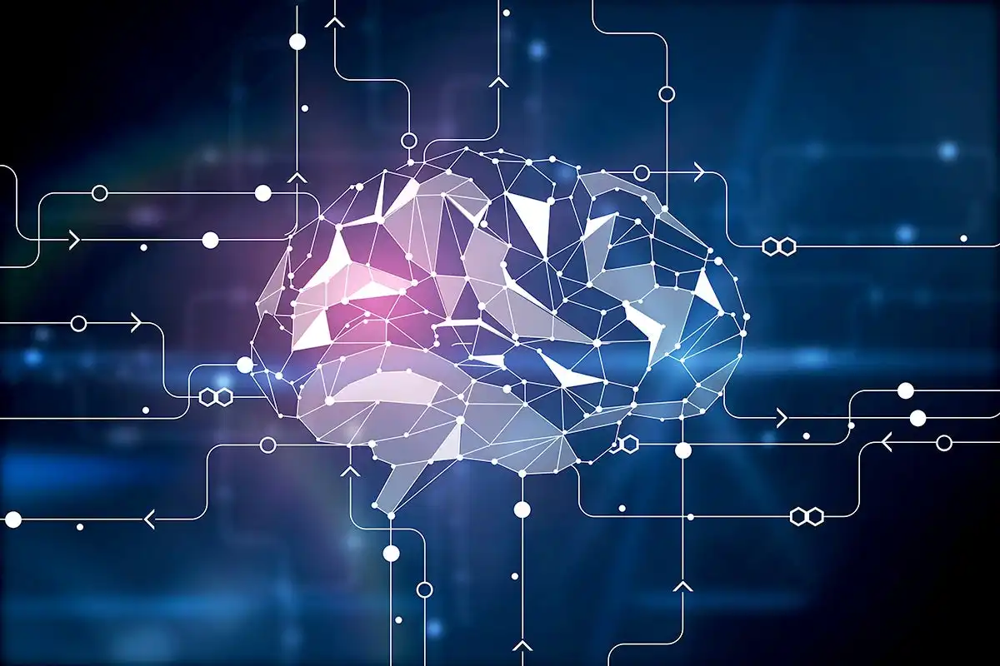

Stages of the project This project is divided into three stages, as modules:

**Module 1.Advanced Data Analytics**

**Module 2. Presentation and Visualization**

**Module 3.Big Data Storage and Processing**

References:

https://www.cio.com/article/189218/what-is-sentiment-analysis-using-nlp-and-ml-to-extract-meaning.html

https://www.linkedin.com/advice/0/what-some-best-practices-adapting-general-sentiment



# **Planning**

**Data Preprocessing**

- **Data Import:** Load the "ProjectTweets.csv" file into data analysis environment, such as Python (using libraries like Pandas) or R.

- **Data Exploration:** Familiarize with the dataset.

- **Data Cleaning:** Address missing data and data quality issues. This may include imputing missing values or removing irrelevant columns.

**Data Analysis**

- **Exploratory Data Analysis (EDA):** Conduct initial EDA to understand the distribution of data. Create summary statistics, visualizations, and identify any patterns or outliers.


**Sentiment Analysis**

- **Text Preprocessing:** The dataset includes tweet text, perform text preprocessing tasks such as lowercasing, removing stop words, punctuation, and special characters, and stemming/lemmatization.

- **labeling and Classification:** Using some basic Bag-of-words or count based techniques. and compared with pre-trained models for labeling the dataset and assign sentiment scores and then classify tweets based on topics or sentiments.

- **Sentiment Analysis:** Apply sentiment analysis techniques to gauge the sentiment of the Seeets. Common sentiment analysis tools or libraries include NLTK (Python) or Sentiment140.

- **Train models for Prediction:** Build and train machine learning models to predict trends on topics or sentiments in the next 1 week, 1 month, and 3 months. Libraries like scikit-learn are used for this purpose.

- **Time-Series Analysis:**The dataset includes a timestamp, analyze how tweet volume or sentiment changes over time. Consider using time-series analysis techniques or libraries like pandas and matplotlib.


**Data Visualization and Insights**

- **Data Visualization:** Create visualizations of the sentiments change, and the accuracy and usefulness of the different techniques to apply sentiment scores, train the models and get some key insights or trends in the dataset.

- **Sentiment Visualization:** Create visualizations, such as sentiment distribution histograms or sentiment over time plots, to understand the overall sentiment trends in the dataset.

- **Trending Topics:** Analyze the most frequently mentioned topics or hashtags in the dataset. Visualize their popularity over time.


**Reporting and Documentation**

- **Results Summary:** Write a concise summary of the insights and findings from your analysis.

- **Methodology:** Document the data preprocessing steps, tools, and techniques used for analysis.

- **Visualizations:** Include visualizations that highlight key findings in the report

- **Conclusion and Recommendations:** Conclude your analysis and provide any recommendations based on your findings.

- **References:** If you used specific libraries, algorithms, or papers, cite them properly.

- **Appendix:**Include code snippets, scripts, or any additional information that supports your analysis.

## **Research Questions**

1.What are the prevailing sentiment trends in tweets related to a specific topic or event on Twitter, and how have these sentiments evolved over time?

2.Can we identify the most influential users in the dataset by analyzing their tweet engagement metrics and what factors contribute to their influence?

3.Are there distinct patterns or clusters of topics in the Twitter dataset, and can we determine the factors that lead to the emergence of these patterns?

4.What are the prevailing sentiment trends in the tweets in the dataset, and how have these sentiments evolved over time?

# **Read and Load the Dataset**

In this step, few dataframe methods are used to look into the data and its features.

Printing Type of data to identify problem.

Printing the data types to confirm if there problems in data.

## Import Libraries

In [ ]:
# Install Libraries in the environment
!pip install pandas
!pip install numpy
#!pip install numpy pandas (it is the same)
!pip install scikit-learn

In [ ]:
import numpy as np
import pandas as pd

# plotting
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize Wordclouds
from wordcloud import WordCloud

In [ ]:
# Work with Dates and Time
from datetime import datetime
import pytz

# Work with text using regular expressions
import re
import string

In [ ]:
# Work with Files in the OS Folders
import os

# List the documents and folders in the URL indicated
for dirname, _, filenames in os.walk('/content/.config/ProjectTweets.csv'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
# Import Google drive to the notebook machine
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
# Importing dataset and examining it
# Read in the data

#Uncomment the proper adress to the file:
#URL = '/content/ProjectTweets.csv'
URL = '/content/.config/ProjectTweets.csv'

DATASET_COLUMNS=['ids','date','flag','user','text']
DATASET_ENCODING = "ISO-8859-1"   # encoding is by default utf-8. if it doesnt work, then try encoding="latin-1"\

data = pd.read_csv(URL, encoding=DATASET_ENCODING, names=DATASET_COLUMNS) #, header=None)
data.sample(5)

,ids,date,flag,user,text
1004435,1880413185,Fri May 22 01:09:07 PDT 2009,NO_QUERY,VioletFiori,"@asiadevinyl hahaha, sorry, sweetheart, couldn..."
684535,2250545591,Sat Jun 20 00:48:50 PDT 2009,NO_QUERY,thedogsbollock,"@Limpar33 2 people who did likewise, restored ..."
1311991,2013550067,Tue Jun 02 22:57:20 PDT 2009,NO_QUERY,GirlBug,That's not to say I don't appreciate my free Q...
1073327,1966765826,Fri May 29 18:21:36 PDT 2009,NO_QUERY,darsky,@jango_taurus thats pretty rad haha. just look...
745142,2282175120,Mon Jun 22 11:02:08 PDT 2009,NO_QUERY,Bowl_the_Bunny,@scifimlb I don't think they have a shipper na...


In [ ]:
# Import the dataset without column names:
#data = pd.read_csv(URL, header=None)

# Rename the columns
#data.columns= ['Index','ids','date','flag','user','text']
data.head()

,ids,date,flag,user,text
0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


## **Familiarizing with the data:**

In this step, few dataframe methods are used to look into the data and its features.

Printing Type of data to identify problems.

Printing the data types to confirm if there problems in data.

In [ ]:
# To display the botton 5 rows
data.tail(5)

,ids,date,flag,user,text
1599995,2193601966,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,AmandaMarie1028,Just woke up. Having no school is the best fee...
1599996,2193601969,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,TheWDBoards,TheWDB.com - Very cool to hear old Walt interv...
1599997,2193601991,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,bpbabe,Are you ready for your MoJo Makeover? Ask me f...
1599998,2193602064,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,tinydiamondz,Happy 38th Birthday to my boo of alll time!!! ...
1599999,2193602129,Tue Jun 16 08:40:50 PDT 2009,NO_QUERY,RyanTrevMorris,happy #charitytuesday @theNSPCC @SparksCharity...


Columns/features in data

In [ ]:
#Listing the features of the dataset
data.columns

Index(['ids', 'date', 'flag', 'user', 'text'], dtype='object')

Shape of data

In [ ]:
data. shape

(1600000, 5)

Length of the dataset

In [ ]:
print('length of data is', len(data))

length of data is 1600000


In [ ]:
# Used to count the number of rows
data.count()

ids     1600000
date    1600000
flag    1600000
user    1600000
text    1600000
dtype: int64

Rows and columns in the dataset

In [ ]:
print('Count of columns in the data is:  ', len(data.columns))
print('Count of rows in the data is:  ', len(data))

Count of columns in the data is:   5
Count of rows in the data is:   1600000


Data information

In [ ]:
# Checking rows and columns format
data.info()
# everything looks fine so far, no encoding errors, no special characters.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1600000 entries, 0 to 1599999
Data columns (total 5 columns):
 #   Column  Non-Null Count    Dtype 
---  ------  --------------    ----- 
 0   ids     1600000 non-null  int64 
 1   date    1600000 non-null  object
 2   flag    1600000 non-null  object
 3   user    1600000 non-null  object
 4   text    1600000 non-null  object
dtypes: int64(1), object(4)
memory usage: 73.2+ MB


Datatypes of all columns

In [ ]:
# Print data types of DataFrame
data.dtypes

ids      int64
date    object
flag    object
user    object
text    object
dtype: object

## Handling Missing or Null values

Checking for null values

In [ ]:
np.sum(data.isnull().any(axis=1))

0

In [ ]:
print("Are there any missing values in the dataset ?", data.isnull().values.any())

Are there any missing values in the dataset ? False


In [ ]:
# Where are the missing or null values?
# sum of missing values: by default axis = 0
data.isnull().sum()

ids     0
date    0
flag    0
user    0
text    0
dtype: int64

In [ ]:
# check missing values
data.isnull()
# Yes, the missing data is the Flags

,ids,date,flag,user,text
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False
...,...,...,...,...,...
1599995,False,False,False,False,False
1599996,False,False,False,False,False
1599997,False,False,False,False,False
1599998,False,False,False,False,False


In [ ]:
# using notnull()
data.notnull()

,ids,date,flag,user,text
0,True,True,True,True,True
1,True,True,True,True,True
2,True,True,True,True,True
3,True,True,True,True,True
4,True,True,True,True,True
...,...,...,...,...,...
1599995,True,True,True,True,True
1599996,True,True,True,True,True
1599997,True,True,True,True,True
1599998,True,True,True,True,True


In [ ]:
# drop missing: drop row contains missing values
# it is inplace = False
data.dropna(how='any').shape

(1600000, 5)

In [ ]:
# Calculate how the dataframe would change if dropping the missing values
print("Shape: \n", data.dropna().shape, "\n")
print("Count of values: \n", data.dropna().count(), "\n")
print("Missing values: \n", data.dropna().isnull().sum())

Shape: 
 (1600000, 5) 

Count of values: 
 ids     1600000
date    1600000
flag    1600000
user    1600000
text    1600000
dtype: int64 

Missing values: 
 ids     0
date    0
flag    0
user    0
text    0
dtype: int64


##Relevance: Dropping Irrelevant Columns and Duplicated Rows

Check unique ids values

In [ ]:
len(data['ids'].unique())

1598315

Check the number of ids values

In [ ]:
data['ids'].nunique()

1598315

Dropping Duplicated Rows

In [ ]:
duplicate_rows_data = data[data.duplicated()]
print("number of duplicate rows: ", duplicate_rows_data.shape)

number of duplicate rows:  (1685, 5)


In [ ]:
duplicate_rows_data.head()

,ids,date,flag,user,text
800261,1467863684,Mon Apr 06 22:33:35 PDT 2009,NO_QUERY,DjGundam,Awwh babs... you look so sad underneith that s...
800300,1467880442,Mon Apr 06 22:38:04 PDT 2009,NO_QUERY,iCalvin,Haven't tweeted nearly all day Posted my webs...
801280,1468053611,Mon Apr 06 23:28:09 PDT 2009,NO_QUERY,mariejamora,@hellobebe I also send some updates in plurk b...
801573,1468100580,Mon Apr 06 23:42:57 PDT 2009,NO_QUERY,cristygarza,good night swetdreamss to everyonee and jare...
801650,1468115720,Mon Apr 06 23:48:00 PDT 2009,NO_QUERY,WarholGirl,@ientje89 aw i'm fine too thanks! yeah i miss ...


In [ ]:
duplicate_rows_data.describe(include='object')

,date,flag,user,text
count,1685,1685,1685,1685
unique,1676,1,1601,1678
top,Fri May 29 17:42:53 PDT 2009,NO_QUERY,Jeff_Hardyfan,&quot;@mileycyrus&quot;you are the best!!!! I ...
freq,2,1685,9,8


In [ ]:
# Who are the users with most tweets, and how many?
duplicate_rows_data.text.value_counts().head(20)

&quot;@mileycyrus&quot;you are the best!!!! I love you  can you give me your e-mail???I want to write with you but I cant                         8
Awwh babs... you look so sad underneith that shop entrance of &quot;Yesterday's Musik&quot;  O-: I like the look of the new transformer movie     1
Was just smiled at by pretty young lady  however, she was probably showing kindness and pity to the aged and infirm                               1
Ah, finally home. Had a nice shower but now have to learn for History  Think I'll learn in front of the PC so it won't be that boring             1
@StephCyrus09 ohkay bye  i lov you to                                                                                                             1
@jtbritto doood... bishop was the last word  I'll start saving sum new ones fer yu guys                                                           1
Going hoomee!!  Have to finish my exam tho  Boo!!                                                               

In [ ]:
# Who are the users with most tweets, and how many?
duplicate_rows_data.user.value_counts().head(20)

Jeff_Hardyfan     9
_shannon1234      4
Kelliekk          4
Danishbrunette    4
mam1cutie         3
olivia_15         3
fjkeogh           3
donniesgirl01     3
gemeg             3
kasey79           3
pcp071098         3
twibirdy          3
mckyliecooper     2
mrcelebrity       2
NatalieGolding    2
KimmiMcfly        2
ilanacharnelle    2
Roebaggs          2
Bubbles_Fly       2
AlleX91           2
Name: user, dtype: int64

In [ ]:
data = data.drop_duplicates()
data.shape

(1598315, 5)

## Format and Feature engineering

We need to process the date-time column in order to have numeric data more appropiate for analysis



In [ ]:
# Convert the text-based datetime into a Pandas datetime object
# We use the pd.to_datetime function to convert the text-based datetime into a Pandas datetime object.
# The format parameter is set to match the format of the input date string.
data['datetime'] = pd.to_datetime(data['date'], format="%a %b %d %H:%M:%S PDT %Y")

# Extract various datetime components
# We extract various datetime components using Pandas datetime accessor
data['year'] = data['datetime'].dt.year
data['month'] = data['datetime'].dt.month
data['day_of_month'] = data['datetime'].dt.day
data['hour_of_day'] = data['datetime'].dt.hour
data['minute_of_hour'] = data['datetime'].dt.minute
data['day_of_week'] = data['datetime'].dt.day_name()
data['day_of_year'] = data['datetime'].dt.dayofyear

# in order to have the week of the year, we need to convert
data['week_of_year'] = data['datetime'].dt.strftime('%U').astype(int)

In [ ]:
# Display the result
data.head()

,ids,date,flag,user,text,datetime,year,month,day_of_month,hour_of_day,minute_of_hour,day_of_week,week_of_year,timezone,day_of_year
0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",2009-04-06 22:19:45,2009,4,6,22,19,Monday,14,PDT,96
1,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...,2009-04-06 22:19:49,2009,4,6,22,19,Monday,14,PDT,96
2,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...,2009-04-06 22:19:53,2009,4,6,22,19,Monday,14,PDT,96
3,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,2009-04-06 22:19:57,2009,4,6,22,19,Monday,14,PDT,96
4,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all....",2009-04-06 22:19:57,2009,4,6,22,19,Monday,14,PDT,96


In [ ]:
# Extract the "PDT" part and check how many different timezones we have
# We use the .str accessor to treat the column as a string, and then we use slicing to extract the characters from the 8th to 6th positions from the end of each string.
data['timezone'] = data['date'].str[-8:-5]
data['timezone'].unique()

Dataset description

In [ ]:
# Have a statistical description of the dataset (only work with numerical values):
#data.describe_option

data.describe()

,ids,year,month,day_of_month,hour_of_day,minute_of_hour,week_of_year,day_of_year
count,1.598315e+06,1598315.0,1.598315e+06,1.598315e+06,1.598315e+06,1.598315e+06,1.598315e+06,1.598315e+06
mean,1.998872e+09,2009.0,5.514845e+00,1.481395e+01,1.096208e+01,2.954145e+01,2.157393e+01,1.508367e+02
std,1.935913e+08,0.0,6.122012e-01,9.789759e+00,7.216102e+00,1.735578e+01,2.436918e+00,1.709716e+01
min,1.467810e+09,2009.0,4.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.400000e+01,9.600000e+01
25%,1.956927e+09,2009.0,5.000000e+00,6.000000e+00,5.000000e+00,1.400000e+01,2.100000e+01,1.480000e+02
50%,2.002114e+09,2009.0,6.000000e+00,1.600000e+01,1.000000e+01,3.000000e+01,2.200000e+01,1.530000e+02
75%,2.177094e+09,2009.0,6.000000e+00,2.100000e+01,1.800000e+01,4.500000e+01,2.400000e+01,1.660000e+02
max,2.329206e+09,2009.0,6.000000e+00,3.100000e+01,2.300000e+01,5.900000e+01,2.500000e+01,1.760000e+02


In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ids,1598315.0,1.998872e+09,1.935913e+08,1.467810e+09,1.956927e+09,2.002114e+09,2.177094e+09,2.329206e+09
year,1598315.0,2.009000e+03,0.000000e+00,2.009000e+03,2.009000e+03,2.009000e+03,2.009000e+03,2.009000e+03
month,1598315.0,5.514845e+00,6.122012e-01,4.000000e+00,5.000000e+00,6.000000e+00,6.000000e+00,6.000000e+00
day_of_month,1598315.0,1.481395e+01,9.789759e+00,1.000000e+00,6.000000e+00,1.600000e+01,2.100000e+01,3.100000e+01
hour_of_day,1598315.0,1.096208e+01,7.216102e+00,0.000000e+00,5.000000e+00,1.000000e+01,1.800000e+01,2.300000e+01
minute_of_hour,1598315.0,2.954145e+01,1.735578e+01,0.000000e+00,1.400000e+01,3.000000e+01,4.500000e+01,5.900000e+01
week_of_year,1598315.0,2.157393e+01,2.436918e+00,1.400000e+01,2.100000e+01,2.200000e+01,2.400000e+01,2.500000e+01
day_of_year,1598315.0,1.508367e+02,1.709716e+01,9.600000e+01,1.480000e+02,1.530000e+02,1.660000e+02,1.760000e+02


In [ ]:
data.describe(include='object')
# This part is very interesting and it requires some good comments about

,date,flag,user,text,day_of_week,timezone
count,1598315,1598315,1598315,1598315,1598315,1598315
unique,774363,1,659775,1581466,7,1
top,Mon Jun 15 12:53:14 PDT 2009,NO_QUERY,lost_dog,isPlayer Has Died! Sorry,Sunday,PDT
freq,20,1598315,549,210,344097,1598315


# **Exploratory Data Analysis**

In [ ]:
# I did this copy to preserve the integrity of the original dataset
df = data.copy()

In [ ]:
# Convert days of the week to an ordinal feature:
# Define the order of the days of the week
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Convert the text-based day of the week to ordinal values
df['day_of_week'] = df['day_of_week'].astype(pd.CategoricalDtype(categories=day_order, ordered=True))

# I can use .cat.codes to convert the ordered categories to numerical codes too

## **Data Visualization of target Variables**

We first group the data in your DataFrame by different time periods (month, day of the month, hour of the day, day of the week, and week of the year).

We then create subplots for each line plot to visualize the number of tweets for each time period.

The line plots display the number of tweets for each respective time period.

<Axes: >

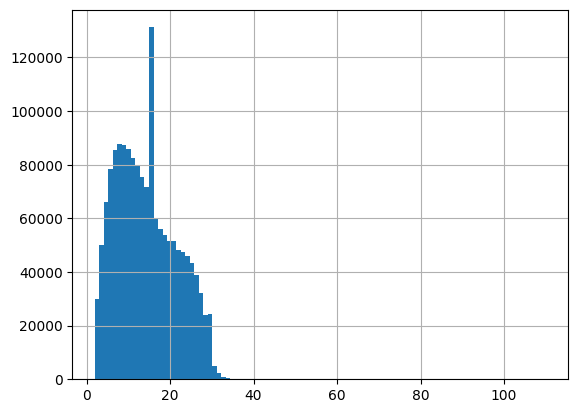

In [ ]:
# Getting the number of words by splitting them by a space
words_per_review = df.text.apply(lambda x: len(x.split(" ")))
words_per_review.hist(bins = 100)

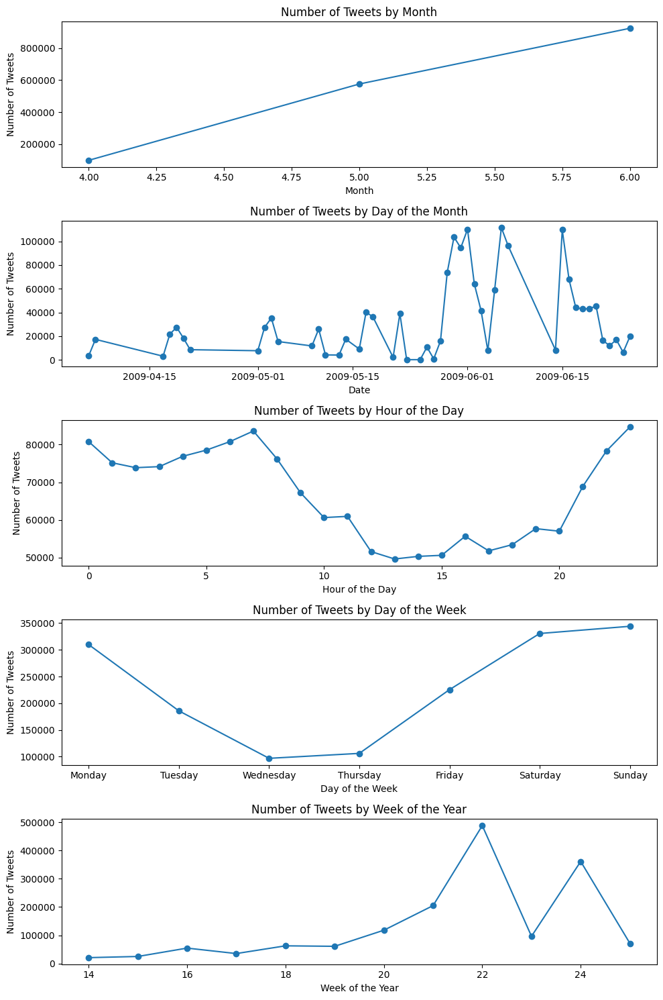

In [ ]:
# Group the data by different time periods
tweets_by_month = df.groupby('month').size()
tweets_by_date = df.groupby('day').size()
tweets_by_hour_of_day = df.groupby('hour_of_day').size()
tweets_by_day_of_week = df.groupby('day_of_week').size()
tweets_by_week_of_year = df.groupby('week_of_year').size()
tweets_by_day_of_year = df.groupby('day_of_year').size()

# Create a subplot with multiple line plots
fig, axes = plt.subplots(5, 1, figsize=(10, 15))

# Plot the number of tweets by month
axes[0].plot(tweets_by_month.index, tweets_by_month.values, marker='o', linestyle='-')
axes[0].set_title('Number of Tweets by Month')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Number of Tweets')

# Plot the number of tweets by day of the month
axes[1].plot(tweets_by_date.index, tweets_by_date.values, marker='o', linestyle='-')
axes[1].set_title('Number of Tweets by Day of the Month')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Number of Tweets')

# Plot the number of tweets by hour of the day
axes[2].plot(tweets_by_hour_of_day.index, tweets_by_hour_of_day.values, marker='o', linestyle='-')
axes[2].set_title('Number of Tweets by Hour of the Day')
axes[2].set_xlabel('Hour of the Day')
axes[2].set_ylabel('Number of Tweets')

# Plot the number of tweets by day of the week
axes[3].plot(tweets_by_day_of_week.index, tweets_by_day_of_week.values, marker='o', linestyle='-')
axes[3].set_title('Number of Tweets by Day of the Week')
axes[3].set_xlabel('Day of the Week')
axes[3].set_ylabel('Number of Tweets')

# Plot the number of tweets by week of the year
axes[4].plot(tweets_by_week_of_year.index, tweets_by_week_of_year.values, marker='o', linestyle='-')
axes[4].set_title('Number of Tweets by Week of the Year')
axes[4].set_xlabel('Week of the Year')
axes[4].set_ylabel('Number of Tweets')

# Adjust layout for better readability
plt.tight_layout()

# Display the plots
plt.show()

## Identifying most common tweets

In [ ]:
# Which are the most common tweets, and how many?
df.text.value_counts().head(20)

isPlayer Has Died! Sorry                                                                                   210
good morning                                                                                               118
headache                                                                                                   115
Good morning                                                                                               112
Headache                                                                                                   106
Not to worry, noone got that one. Next question starts in 1 minute, get your thinking caps on               86
 cant afford to see Angels and Demons, so i watched it for free: http://tr.im/lvBu                          86
Goodnight                                                                                                   85
my tummy hurts                                                                                              81
J

## Identifying most prolific twitters

In [ ]:
# How many unique users have tweeted in this set?
len(df.user.unique())

659775

In [ ]:
# Who are the users with most tweets, and how many?
# We use the value_counts() function to count the frequency of each user in the 'user' column.
user_counts = df.user.value_counts().head(20)
user_counts

lost_dog           549
webwoke            345
tweetpet           310
SallytheShizzle    281
VioletsCRUK        279
mcraddictal        276
tsarnick           248
what_bugs_u        246
Karen230683        238
DarkPiano          236
SongoftheOss       227
Jayme1988          225
keza34             219
ramdomthoughts     216
shanajaca          213
wowlew             212
nuttychris         211
TraceyHewins       211
thisgoeshere       207
Spidersamm         205
Name: user, dtype: int64

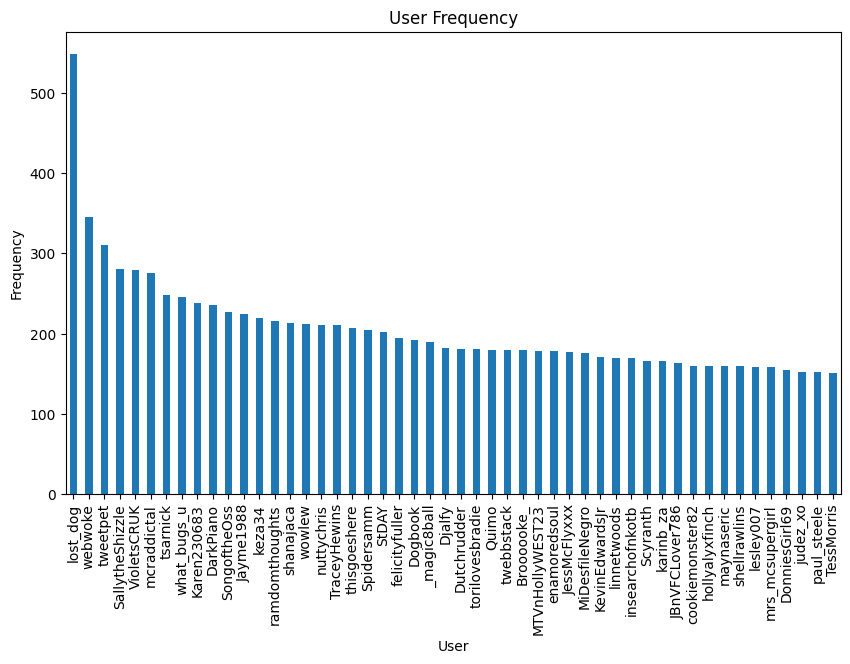

In [ ]:
# Create a bar chart
# We create a bar plot using Matplotlib with user names on the x-axis and tweet frequencies on the y-axis.
plt.figure(figsize=(10, 6))
user_counts.plot(kind='bar')
plt.title('User Frequency')
plt.xlabel('User')
plt.ylabel('Frequency')

# Show the bar chart
plt.show()

In [ ]:
# Group the data by a time period, e.g., day of the month
# We count the number of tweets per user and select the top 20 most frequent users.
# user_counts = df.user.value_counts().head(20)
# We filter the DataFrame to include only tweets from the top 20 users.
filtered_df =  df[df.user.isin(user_counts.index)]
# We group the data by date
grouped_df = filtered_df .groupby('day')['user']
# and count the number of tweets on each day.
user_frequency_over_time = grouped_df.value_counts()
# Pivot the table in order to fill null values (days when the user did not post) with zeros
user_frequency_over_time = user_frequency_over_time.unstack(fill_value=0)
user_frequency_over_time

user,DarkPiano,Jayme1988,Karen230683,SallytheShizzle,SongoftheOss,Spidersamm,TraceyHewins,VioletsCRUK,keza34,lost_dog,mcraddictal,nuttychris,ramdomthoughts,shanajaca,thisgoeshere,tsarnick,tweetpet,webwoke,what_bugs_u,wowlew
day,,,,,,,,,,,,,,,,,,,,
2009-04-06,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0
2009-04-07,1,2,4,0,0,0,6,3,0,0,0,0,13,5,0,15,0,0,0,0
2009-04-17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,7,0,0,0
2009-04-18,2,0,3,0,0,0,1,2,0,0,1,0,2,0,4,0,9,0,0,0
2009-04-19,6,2,1,0,0,0,5,4,5,0,0,35,9,0,4,9,22,0,0,0
2009-04-20,8,3,1,0,0,0,6,1,8,0,1,23,0,2,4,5,29,0,0,0
2009-04-21,2,0,1,0,0,0,0,7,2,0,1,0,0,0,0,2,65,0,0,0
2009-05-01,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,2,63,0,0,0
2009-05-02,5,1,5,0,1,2,6,4,12,7,0,26,0,0,5,12,115,0,0,0


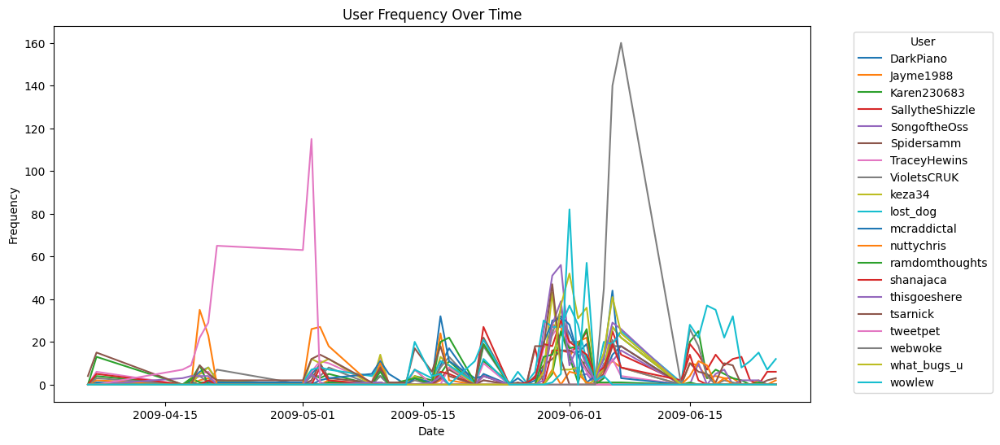

In [ ]:
# Create a line plot
user_frequency_over_time.plot(figsize=(12, 6))
plt.title('User Frequency Over Time')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.legend(title='User', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the line plot
plt.show()

## Heatmap: Which hours of which days are more tweets generated?

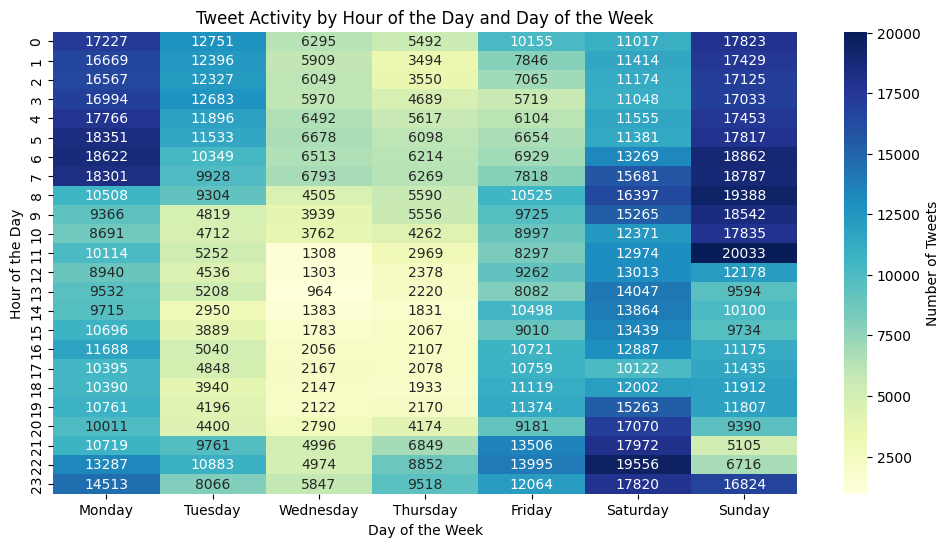

In [ ]:
# Group and count tweets by day of the week and hour of the day
tweet_activity = df.groupby(['hour_of_day','day_of_week']).size().unstack()

# Create the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(tweet_activity, cmap='YlGnBu', annot=True, fmt='d', cbar_kws={'label': 'Number of Tweets'})
plt.title('Tweet Activity by Hour of the Day and Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Hour of the Day')

# Show the heatmap
plt.show()

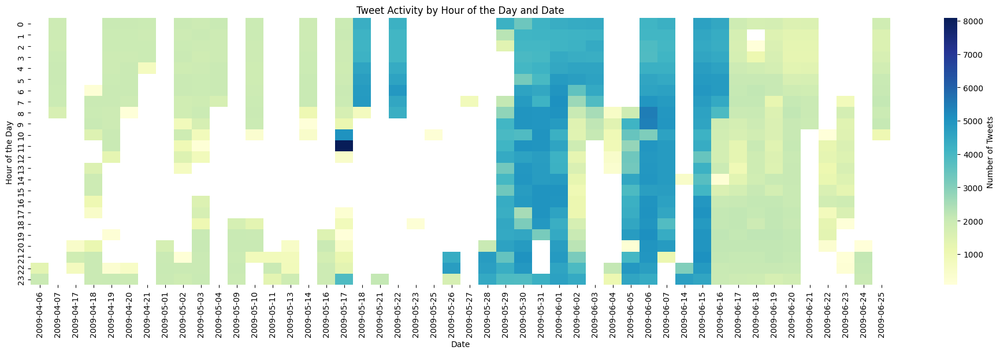

In [ ]:
# Group and count tweets by date and hour of the day
tweet_activity = df.groupby(['hour_of_day', 'day']).size().unstack()

# Create the heatmap
plt.figure(figsize=(24, 6))
sns.heatmap(tweet_activity, cmap='YlGnBu', fmt='d', cbar_kws={'label': 'Number of Tweets'})
plt.title('Tweet Activity by Hour of the Day and Date')
plt.xlabel('Date')
plt.ylabel('Hour of the Day')

# Show the heatmap
plt.show()

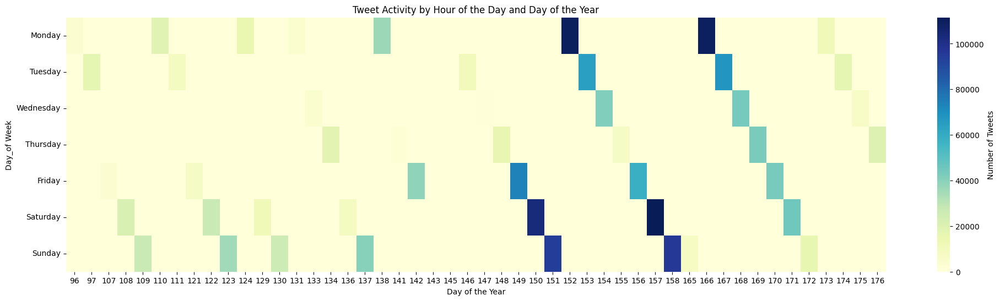

In [ ]:
# Group and count tweets by day of the year and hour of the day
tweet_activity = df.groupby(['day_of_week', 'day_of_year']).size().unstack()

# Create the heatmap
plt.figure(figsize=(24, 6))
sns.heatmap(tweet_activity, cmap='YlGnBu', fmt='d', cbar_kws={'label': 'Number of Tweets'})
plt.title('Tweet Activity by Hour of the Day and Day of the Year')
plt.xlabel('Day of the Year')
plt.ylabel('Day_of Week')

# Show the heatmap
plt.show()

## Word Clouds
Generate word clouds to visualize the most frequent words or hashtags used in the tweets.

total words collected:  740253


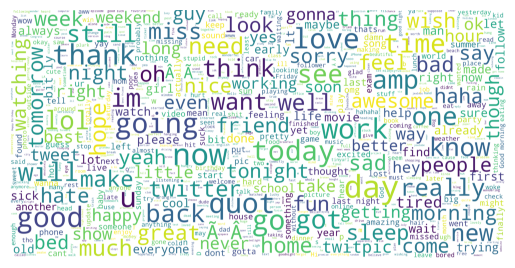

In [ ]:
# Take a random sample of 10000 tweets and join all its words in a single text
word_cloud_text = ''.join(df.sample(10000).text)
print("total words collected: ", len(word_cloud_text))

# Using the library Wordcloud
wordcloud = WordCloud(
    max_font_size=50,
    max_words=800,
    background_color="white",
    scale=10,
    width=800,
    height=400
).generate(word_cloud_text)

plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

# **Data processing**

Whenever we work on any NLP related problem, we process a lot of textual data. The textual data after processing needs to be fed into the model.

Since the model doesn’t accept textual data and only understands numbers, this data needs to be vectorized.

Before we use text for modeling we need to process it. The steps include removing stop words, lemmatizing, stemming, tokenization, and vectorization. Vectorization is a process of converting the text data into a machine-readable form. The words are represented as vectors.

The **Bag of Words(BoW)** model is a fundamental way of doing this, it discards all the information and order of the text and just considers the occurrences of the word. It converts the documents to a fixed-length vector of numbers. A unique number is assigned to each word. Within the length of the vocabulary(vocabulary means a collection of all the unique words), the frequency of words is assigned. This is the encoding of the words, in which we are focusing on the representation of the word and not on the order of the word.

**CountVectorizer** is a great tool provided by the scikit-learn library in Python. It is used to transform a given text into a vector on the basis of the frequency (count) of each word that occurs in the entire text. It tokenizes(tokenization means dividing the sentences in words) the text along with performing very basic preprocessing. It removes the punctuation marks and converts all the words to lowercase. The vocabulary of known words is formed which is also used for encoding unseen text later. An encoded vector is returned with a length of the entire vocabulary and an integer count for the number of occurences of the word.

In [ ]:
!pip install vaderSentiment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 2.2 MB/s eta 0:00:00


In [ ]:
# Import Libraries
from textblob import TextBlob

# do NLP over texts with nltk
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk import word_tokenize

# We will use the list of stopwords from NLTK
from nltk.corpus import stopwords   # A module to generate a list of Stopwords
nltk.download('stopwords')          # A list of really common words, like articles, pronouns, prepositions, and conjunctions
nltk.download('punkt')              # A data model created by Jan Strunk that NLTK uses to split full texts into word lists
nltk.download('wordnet')
nltk.download('omw-1.4')
# Download dataset
nltk.download('twitter_samples')

#from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')  # A scored list of words and jargon that NLTK references when performing sentiment analysis, created by C.J. Hutto and Eric Gilbert

In [ ]:
!pip install aruana
!pip install emoji --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 466.1/466.1 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.9/358.9 kB 4.4 MB/s eta 0:00:00


In [ ]:
# More Tex processing libraries
import emoji
from aruana import Aruana

## **Data Preprocessing**

In this step of the problem definition given above, before training the model, I will perform several pre-processing steps on the dataset which mainly addressed removing stop words, removing special characters like emojis, hashtags, etc. case for better generalization.

After following this step, the scores were cleaned and removed, thus reducing unnecessary noise from the dataset. After that, I also removed the repeated characters from the words and removed the URLs as they do not have any significant importance.

Finally, I performed Stemming reducing words to their derived stems and Lemmatization reducing derived words to their root form, known as lemma for better results.

A better discussion about shortcommings of many available approaches can be found here:
- https://towardsdatascience.com/fine-grained-sentiment-analysis-in-python-part-1-2697bb111ed4
- https://huggingface.co/blog/sentiment-analysis-python


In [ ]:
# from this point, work only with a sample of the full dataset:
#df = df.sample(100000)
#df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 1482516 to 615262
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ids             10000 non-null  int64         
 1   date            10000 non-null  object        
 2   flag            10000 non-null  object        
 3   user            10000 non-null  object        
 4   text            10000 non-null  object        
 5   datetime        10000 non-null  datetime64[ns]
 6   day             10000 non-null  object        
 7   year            10000 non-null  int64         
 8   month           10000 non-null  int64         
 9   day_of_month    10000 non-null  int64         
 10  hour_of_day     10000 non-null  int64         
 11  minute_of_hour  10000 non-null  int64         
 12  day_of_week     10000 non-null  category      
 13  day_of_year     10000 non-null  int64         
 14  week_of_year    10000 non-null  int64         


Making statement text in lowercase

In [ ]:
df['preprocess_text']=df['text'].str.lower()
df['preprocess_text'].tail()

Cleaning and removing URLs

In [ ]:
def cleaning_URLs(text):
    #URLless_string = re.sub('((www.[^s]+)|(https?://[^s]+))',' ',text)
    URLless_string = re.sub(r'https?://(?:www\.)?\S+', '', text)
    return URLless_string
df['preprocess_text'] = df['preprocess_text'].apply(lambda x: cleaning_URLs(x))
df['preprocess_text'].tail()

Separating Hashtags from the text.

In [ ]:
# Function to extract mentions from a text
def extract_hashtags(text):
    mentions = re.findall(r'#(\w+)', text)
    return mentions

def cleaning_hashtags(text):
    return re.sub('#(\w+)',' ',text)

In [ ]:
%%time
# Apply the function to the 'text' column in the DataFrame
df['hashtags'] = df['preprocess_text'].apply(extract_hashtags)
df['preprocess_text'] = df['preprocess_text'].apply(lambda x: cleaning_hashtags(x))

CPU times: user 5.55 s, sys: 750 ms, total: 6.3 s
Wall time: 6.38 s


Separating Users from the text.

In [ ]:
# Function to extract mentions from a text
def extract_mentions(text):
    mentions = re.findall(r'@(\w+)', text)
    return mentions

def cleaning_Mentions(text):
    return re.sub('@(\w+)',' ',text)

In [ ]:
%%time
# Apply the function to the 'text' column in the DataFrame
df['mentions'] = df['preprocess_text'].apply(extract_mentions)
df['preprocess_text'] = df['preprocess_text'].apply(lambda x: cleaning_mentions(x))
df[['text', 'preprocess_text', 'mentions', 'hashtags']].head()

CPU times: user 6.71 s, sys: 1.07 s, total: 7.78 s
Wall time: 7.85 s


,text,preprocess_text,mentions,hashtags
0,"@switchfoot http://twitpic.com/2y1zl - Awww, t...","http://twitpic.com/2y1zl - Awww, that's a bu...",[switchfoot],[]
1,is upset that he can't update his Facebook by ...,is upset that he can't update his Facebook by ...,[],[]
2,@Kenichan I dived many times for the ball. Man...,I dived many times for the ball. Managed to ...,[Kenichan],[]
3,my whole body feels itchy and like its on fire,my whole body feels itchy and like its on fire,[],[]
4,"@nationwideclass no, it's not behaving at all....","no, it's not behaving at all. i'm mad. why a...",[nationwideclass],[]


Cleaning and removing repeating characters

In [ ]:
import re
def cleaning_repeating_char(text):
    #cleaned_text = re.sub(r'(.)1+', r'1', text)
    cleaned_text = re.sub(r'(\w)\1{2,}', r'\1\1', text)
    return cleaned_text
df['preprocess_text'] = df['preprocess_text'].apply(lambda x: cleaning_repeating_char(x))
df['preprocess_text'].tail()

Cleaning and removing punctuations

In [ ]:
import string
punctuations_list =  string.punctuation
def cleaning_punctuations(text):
    translator = str.maketrans('', '', punctuations_list)
    return text.translate(translator)
df['preprocess_text']= df['preprocess_text'].apply(lambda x: cleaning_punctuations(x))
df['preprocess_text'].tail()

Cleaning and removing numeric numbers

In [ ]:
def cleaning_numbers(text):
    return re.sub('[0-9]+', '', text)
df['preprocess_text'] = df['preprocess_text'].apply(lambda x: cleaning_numbers(x))
df['preprocess_text'].tail()

Defining set containing all stopwords in English

In [ ]:
stopwordlist = ['a', 'about', 'above', 'after', 'again', 'ain', 'all', 'am', 'an',
             'and','any','are', 'as', 'at', 'be', 'because', 'been', 'before',
             'being', 'below', 'between','both', 'by', 'can', 'd', 'did', 'do',
             'does', 'doing', 'down', 'during', 'each','few', 'for', 'from',
             'further', 'had', 'has', 'have', 'having', 'he', 'her', 'here',
             'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in',
             'into','is', 'it', 'its', 'itself', 'just', 'll', 'm', 'ma',
             'me', 'more', 'most','my', 'myself', 'now', 'o', 'of', 'on', 'once',
             'only', 'or', 'other', 'our', 'ours','ourselves', 'out', 'own', 're','s', 'same', 'she', "shes", 'should', "shouldve",'so', 'some', 'such',
             't', 'than', 'that', "thatll", 'the', 'their', 'theirs', 'them',
             'themselves', 'then', 'there', 'these', 'they', 'this', 'those',
             'through', 'to', 'too','under', 'until', 'up', 've', 'very', 'was',
             'we', 'were', 'what', 'when', 'where','which','while', 'who', 'whom',
             'why', 'will', 'with', 'won', 'y', 'you', "youd","youll", "youre",
             "youve", 'your', 'yours', 'yourself', 'yourselves']

Cleaning and removing the above stop words list from the tweet text

In [ ]:
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stopwordlist])
df['preprocess_text'] = df['preprocess_text'].apply(lambda text: cleaning_stopwords(text))
df['preprocess_text'].head()

 Getting tokenization of tweet text

In [ ]:
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer(r'w+')
def tokenize_text(text):
    return word_tokenize(text)
df['tokenized_text'] = df['preprocess_text'].apply(tokenize_text)
df['tokenized_text'].head()

Applying stemming

In [ ]:
import nltk
st = nltk.PorterStemmer()
def stemming_on_text(tokenized_data):
    stemmed_words = [st.stem(word) for word in tokenized_data]
    stemmed_text = " ".join(stemmed_words)
    return stemmed_text
df['stemmed_text']= df['tokenized_text'].apply(lambda x: stemming_on_text(x))
df['stemmed_text'].head()

Applying lemmatizer

In [ ]:
lm = nltk.WordNetLemmatizer()
def lemmatizer_on_text(tokenized_data):
    lemmatized_words = [lm.lemmatize(word) for word in tokenized_data]
    lemmatized_text = " ".join(lemmatized_words)
    return lemmatized_text
df['lemmatized_text'] = df['tokenized_text'].apply(lambda x: lemmatizer_on_text(x))
df['lemmatized_text'].head()

### Single function for Preprocessing the text
This is another implementation of the same steps, but faster:

In [ ]:
# First, we will convert the texts to lowercase and eliminate punctuation signs and stopwords.
# then we tokenize the string (each token is a word)
def text_prep(x):
     text = str(x).lower()
     text = re.sub('@(\w+)', '', text)
     text = re.sub(r'https?://(?:www\.)?\S+', '', text)
     text = re.sub(r'(\w)\1{2,}', r'\1\1', text)
     cleaned_text = re.sub('[^a-zA-Z]+',' ', text).strip()
     tokens = word_tokenize(cleaned_text)
     words = [t for t in tokens if t not in stopwordlist]
     lemmatized_words = [lm.lemmatize(w) for w in words]
     lemmatized_text = " ".join(lemmatized_words)
     return lemmatized_text

In [ ]:
# Test the Function
print(df["text"][0])
print(text_prep(df["text"][0]))

"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer.  You shoulda got David Carr of Third Day to do it. ;D"

In [ ]:
text_prep(df["text"][0])

'aww bummer shoulda got david carr third day'

In [ ]:
%%time
#Now, we will apply this function to every text in the ‘body‘ column.
df["preprocessTxt"] = df['text'].apply(lambda x: text_prep(x))  # faster than [text_prep(i) for i in df['text']]
df["preprocessTxt"].head()

CPU times: user 4min, sys: 2.89 s, total: 4min 3s
Wall time: 4min 5s


0    [aww, bummer, shoulda, got, david, carr, third...
1    [upset, update, facebook, texting, might, cry,...
2    [dived, many, time, ball, managed, save, rest,...
3               [whole, body, feel, itchy, like, fire]
4                  [no, not, behaving, mad, see, over]
Name: preprocessTxt, dtype: object

In [ ]:
df[['text', 'preprocess_text', 'mentions', 'preprocessTxt', 'tokenized_text', 'stemmed_text', 'lemmatized_text']].head()

,text,preprocess_text,mentions,preprocessTxt,tokenized_text,stemmed_text,lemmatized_text
0,"@switchfoot http://twitpic.com/2y1zl - Awww, t...","- aww, that's a bummer. you shoulda got da...",[switchfoot],aww bummer shoulda got david carr third day,"[aww, thats, bummer, shoulda, got, david, carr...",aww that bummer shoulda got david carr third day,aww thats bummer shoulda got david carr third day
1,is upset that he can't update his Facebook by ...,is upset that he can't update his facebook by ...,[],upset update facebook texting might cry result...,"[upset, cant, update, facebook, texting, might...",upset cant updat facebook text might cri resul...,upset cant update facebook texting might cry r...
2,@Kenichan I dived many times for the ball. Man...,i dived many times for the ball. managed to ...,[kenichan],dived many time ball managed save rest go bound,"[dived, many, times, ball, managed, save, rest...",dive mani time ball manag save rest go bound,dived many time ball managed save rest go bound
3,my whole body feels itchy and like its on fire,my whole body feels itchy and like its on fire,[],whole body feel itchy like fire,"[whole, body, feels, itchy, like, fire]",whole bodi feel itchi like fire,whole body feel itchy like fire
4,"@nationwideclass no, it's not behaving at all....","no, it's not behaving at all. i'm mad. why a...",[nationwideclass],no not behaving mad see over,"[no, not, behaving, im, mad, cant, see, over]",no not behav im mad cant see over,no not behaving im mad cant see over


## **Labeling**
Assigning a Sentiment Score Using Positive and Negative Word Counts

For this, we have taken the positive-text.txt and negative-text.txt files or generally known as Opinion Lexicon by the respective authors(s).

The same can be downloaded from https://www.cs.uic.edu/~liub/FBS/sentiment-analysis.html.

Reference:

https://www.analyticsvidhya.com/blog/2021/12/different-methods-for-calculating-sentiment-score-of-text/

https://medium.com/analytics-vidhya/sentiment-analysis-with-vader-label-the-unlabeled-data-8dd785225166

https://stackoverflow.com/questions/61185290/is-it-possible-to-do-sentiment-analysis-of-unlabelled-text-using-word2vec-model

https://stackoverflow.com/questions/63024842/how-to-assign-labels-score-to-data-using-machine-learning

https://plainenglish.io/blog/twitter-sentiment-analysis-using-vader-tweepy-b2a62fba151e

https://textblob.readthedocs.io/en/dev/quickstart.html

https://stackabuse.com/python-for-nlp-introduction-to-the-textblob-library/

https://towardsdatascience.com/unsupervised-text-classification-with-lbl2vec-6c5e040354de

https://towardsdatascience.com/unsupervised-sentiment-analysis-a38bf1906483

https://towardsdatascience.com/how-to-label-text-for-sentiment-analysis-good-practises-2dce9e470708

https://improveandrepeat.com/2013/11/mapreduce-a-simple-explanation/


In [ ]:
%%time
# I calculated the number of resultant words for each text. This will be helpful later when we calculate the Sentiment Score.
df['total_len'] = df['preprocess_txt'].map(lambda x: len(x))

CPU times: user 7.24 ms, sys: 0 ns, total: 7.24 ms
Wall time: 7.62 ms


In [ ]:
# In the next step, we defined the generic Negative Words and Positive Words list.

pos_words = open("/content/drive/MyDrive/Nurse Salaries Project/positive-words.txt").readlines()
neg_words = open("/content/drive/MyDrive/Nurse Salaries Project/negative-words.txt").readlines()

# The appearance of an opinion word in a sentence does not necessarily mean that the sentence expresses a positive or negative opinion.
# I will notice many misspelled words in the list. They are not mistakes. They are included as these misspelled words appear frequently in social media content.

In [ ]:
%%time
# Then, we count the number of positive and negative words from the corpus of texts.
num_pos = df['preprocess_txt'].map(lambda x: len([i for i in x if i in pos_words]))
df['pos_count'] = num_pos
num_neg = df['preprocess_txt'].map(lambda x: len([i for i in x if i in neg_words]))
df['neg_count'] = num_neg

CPU times: user 8.41 s, sys: 14.1 ms, total: 8.42 s
Wall time: 8.53 s


In [ ]:
%%time
# Finally, different methods of assigning a sentiment score based in counting the positive and negative words.
# 1. With Normalization for Calculating Sentiment Score: taking the ratio of the difference of Positive and Negative Word Counts and Total Word Count
#df['sentiment_score_Norm'] = round((df['pos_count'] - df['neg_count']) / df['total_len'], 2)
# [Didnt Work ]

CPU times: user 1.37 ms, sys: 10 µs, total: 1.38 ms
Wall time: 1.39 ms


In [ ]:
%%time
# 2. With Semi Normalization to calculate Sentiment Score: by evaluating the ratio of Count of Positive Words and Count of Negative Words + 1.
# Since there is no difference of values involved, the sentiment value will always be more than 0. Also, adding 1 in the denominator would save from Zero Division Error
# df['sentiment_score_Stan'] = round(df['pos_count'] / (df['neg_count']+1), 2)
# [Didnt Work ]

CPU times: user 1.3 ms, sys: 8 µs, total: 1.31 ms
Wall time: 1.32 ms


In [ ]:
# 3.  Using the TextBlob library: Simple rule-based API for sentiment analysis. The sentiment is expressed with two values — Polarity and Subjectivity, we use the first only.
# https://stackoverflow.com/questions/63024842/how-to-assign-labels-score-to-data-using-machine-learning

# Using the TextBlob method, from NLTK
%%time
from textblob import TextBlob
df['sentiment_score_TextBlob'] = df['lemmatized_text2'].apply(lambda Tweet: TextBlob(Tweet).sentiment[0])

CPU times: user 2.97 s, sys: 9.3 ms, total: 2.98 s
Wall time: 3.06 s


In [ ]:
%%time
# 4.  Using VADER SentimentIntensityAnalyser lexicon: VADER is a long-form for Valence Aware and sEntiment Reasoner, a Parsimonious rule-based model for sentiment analysis of social media text. tool.
# VADER calculates text emotions and determines whether the text is positive, neutral or, negative.
# This analyzer calculates compound: the sum of all positive, negative and neutral scores, normalized between -1 and 1
# https://plainenglish.io/blog/twitter-sentiment-analysis-using-vader-tweepy-b2a62fba151e

# create the instance of SentimentIntensityAnalyzer, from NLTK.
sent = SentimentIntensityAnalyzer()
polarity = [round(sent.polarity_scores(i)['compound'], 2) for i in df['text']]
df['sentiment_score_Vader'] = polarity

CPU times: user 1.83 s, sys: 4.21 ms, total: 1.83 s
Wall time: 1.84 s


In [ ]:
# 5.  Using Aruana Library, an NLP library focused in portuguese texts
#%%time
#aruana = Aruana('en')
#sentiment = aruana.random_classification(df['text'], classes=[0,1], balanced=True)
#df['sentiment_class_Aruana'] = sentiment
# [ This Does not work very well, maybe because it is just randomly assigning 1 or 0]

Class 0: 4998 values
Class 1: 5001 values
CPU times: user 18.8 ms, sys: 1.97 ms, total: 20.7 ms
Wall time: 22.9 ms


/usr/local/lib/python3.10/dist-packages/aruana/aruana.py:1258: Warning: Could not load model. Execution will continue, but you can't do annotations unless you download the necessary models.
  warnings.warn('Could not load model. Execution will continue, but you can\'t do annotations unless you download the necessary models.', Warning)


In [ ]:
%%time
# Define the bin edges and labels for three classes
bin_edges = [-1, -0.05, 0.05, 1]
class_labels = ['Negative', 'Neutral', 'Positive']

# Use pd.cut to classify the scores and create a new 'class' column
df['sentiment_class_TextBlob'] = pd.cut(df['sentiment_score_TextBlob'], bins=bin_edges, labels=class_labels)
df['sentiment_class_Vader'] = pd.cut(df['sentiment_score_Vader'], bins=bin_edges, labels=class_labels)

In [ ]:
df.head()

,ids,date,flag,user,text,datetime,day,year,month,day_of_month,...,preprocessTxt,tokenized_text,stemmed_text,lemmatized_text,lemmatized_text2,total_len,sentiment_score_TextBlob,sentiment_score_Vader,sentiment_class_TextBlob,sentiment_class_Vader
0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",2009-04-06 22:19:45,2009-04-06,2009,4,6,...,aww thats bummer shoulda got david carr third day,"[aww, thats, bummer, shoulda, got, david, carr...",aww that bummer shoulda got david carr third day,aww thats bummer shoulda got david carr third day,aww bummer shoulda got david carr third day,9,0.150,-0.20,Neutral,Neutral
1,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...,2009-04-06 22:19:49,2009-04-06,2009,4,6,...,upset cant update facebook texting might cry r...,"[upset, cant, update, facebook, texting, might...",upset cant updat facebook text might cri resul...,upset cant update facebook texting might cry r...,upset update facebook texting might cry result...,12,0.000,-0.75,Neutral,Negative
2,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...,2009-04-06 22:19:53,2009-04-06,2009,4,6,...,dived many times ball managed save rest go bounds,"[dived, many, times, ball, managed, save, rest...",dive mani time ball manag save rest go bound,dived many time ball managed save rest go bound,dived many time ball managed save rest go bound,9,0.500,0.49,Neutral,Neutral
3,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,2009-04-06 22:19:57,2009-04-06,2009,4,6,...,whole body feels itchy like fire,"[whole, body, feels, itchy, like, fire]",whole bodi feel itchi like fire,whole body feel itchy like fire,whole body feel itchy like fire,6,0.200,-0.25,Neutral,Neutral
4,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all....",2009-04-06 22:19:57,2009-04-06,2009,4,6,...,behaving im mad cant see,"[behaving, im, mad, cant, see]",behav im mad cant see,behaving im mad cant see,behaving mad see,5,-0.625,-0.66,Negative,Negative


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ids,1598315.0,1.998872e+09,1.935913e+08,1.467810e+09,1.956927e+09,2.002114e+09,2.177094e+09,2.329206e+09
year,1598315.0,2.009000e+03,0.000000e+00,2.009000e+03,2.009000e+03,2.009000e+03,2.009000e+03,2.009000e+03
month,1598315.0,5.514845e+00,6.122012e-01,4.000000e+00,5.000000e+00,6.000000e+00,6.000000e+00,6.000000e+00
day_of_month,1598315.0,1.481395e+01,9.789759e+00,1.000000e+00,6.000000e+00,1.600000e+01,2.100000e+01,3.100000e+01
hour_of_day,1598315.0,1.096208e+01,7.216102e+00,0.000000e+00,5.000000e+00,1.000000e+01,1.800000e+01,2.300000e+01
minute_of_hour,1598315.0,2.954145e+01,1.735578e+01,0.000000e+00,1.400000e+01,3.000000e+01,4.500000e+01,5.900000e+01
day_of_year,1598315.0,1.508367e+02,1.709716e+01,9.600000e+01,1.480000e+02,1.530000e+02,1.660000e+02,1.760000e+02
week_of_year,1598315.0,2.157393e+01,2.436918e+00,1.400000e+01,2.100000e+01,2.200000e+01,2.400000e+01,2.500000e+01
total_len,1598315.0,7.197877e+00,3.996089e+00,0.000000e+00,4.000000e+00,7.000000e+00,1.000000e+01,1.290000e+02
sentiment_score_TextBlob,1598315.0,9.756163e-02,3.353769e-01,-1.000000e+00,0.000000e+00,0.000000e+00,3.000000e-01,1.000000e+00


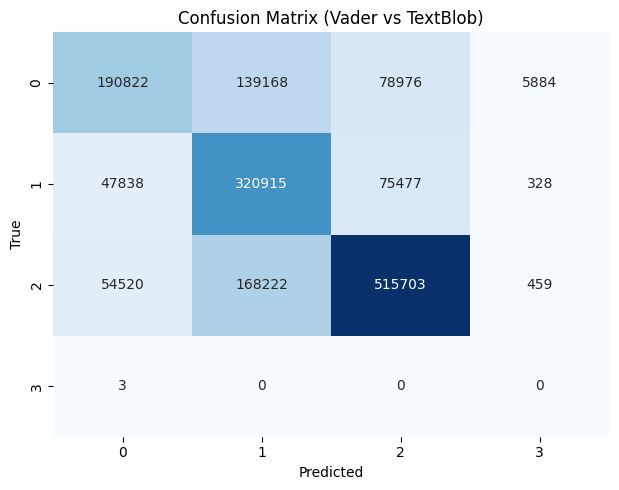

In [ ]:
#Having VADER labeling as a reference, how good is TextBlob?
# First, convert the columns to categorical
df['sentiment_class_Vader'] = df['sentiment_class_Vader'].astype(str).astype('category')
df['sentiment_class_TextBlob'] = df['sentiment_class_TextBlob'].astype(str).astype('category')

# Create confusion matrices for both predicted classifications
confusion_matrix_1 = confusion_matrix(df['sentiment_class_Vader'], df['sentiment_class_TextBlob'])

# Plot the confusion matrix
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix_1, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Vader vs TextBlob)')
plt.xlabel('Predicted')
plt.ylabel('True')

plt.tight_layout()
plt.show()

### Save Labeled Preprocessed file

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1598315 entries, 0 to 1599999
Data columns (total 28 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   ids                       1598315 non-null  int64         
 1   date                      1598315 non-null  object        
 2   flag                      1598315 non-null  object        
 3   user                      1598315 non-null  object        
 4   text                      1598315 non-null  object        
 5   datetime                  1598315 non-null  datetime64[ns]
 6   day                       1598315 non-null  object        
 7   year                      1598315 non-null  int64         
 8   month                     1598315 non-null  int64         
 9   day_of_month              1598315 non-null  int64         
 10  hour_of_day               1598315 non-null  int64         
 11  minute_of_hour            1598315 non-null  int64 

In [ ]:
%%time
df.to_csv('/content/drive/MyDrive/ProjectTweets(2).csv')

In [ ]:
# Read the saved file
df = pd.read_csv('/content/drive/MyDrive/ProjectTweets(2).csv')

# Visualization of Trends

## Frequency of Sentiment Analysis

- Histogram: Plot a histogram of sentiment scores to understand the overall sentiment of the tweets.
- Box Plot: Create a box plot to visualize the distribution of sentiment scores.

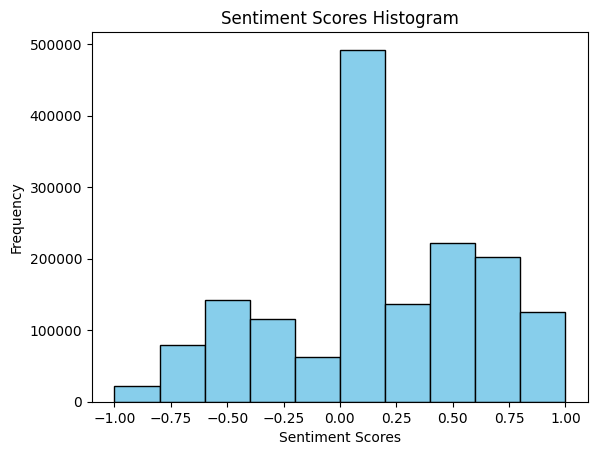

In [ ]:
# Create a histogram
plt.hist(df[['sentiment_score_Vader']], bins=10, color='skyblue', edgecolor='black')

# Customize the plot
plt.title('Sentiment Scores Histogram')
plt.xlabel('Sentiment Scores')
plt.ylabel('Frequency')

# Show the plot
plt.show()


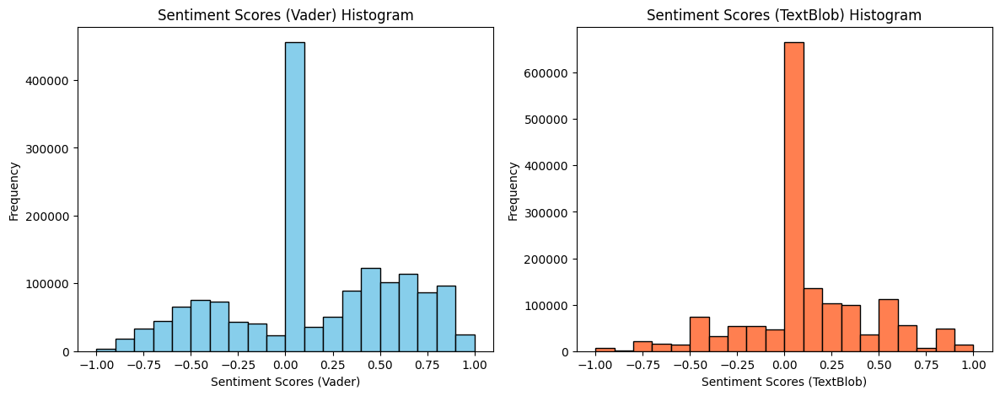

In [ ]:
# Create a histogram

# Create a figure with two side-by-side subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# First subplot for sentiment_score_Vader
axes[0].hist(df[['sentiment_score_Vader']], bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Sentiment Scores (Vader) Histogram')
axes[0].set_xlabel('Sentiment Scores (Vader)')
axes[0].set_ylabel('Frequency')

# Second subplot for sentiment_score_TextBlob
axes[1].hist(df[['sentiment_score_TextBlob']], bins=20, color='coral', edgecolor='black')
axes[1].set_title('Sentiment Scores (TextBlob) Histogram')
axes[1].set_xlabel('Sentiment Scores (TextBlob)')
axes[1].set_ylabel('Frequency')

# Show the plot
plt.show()

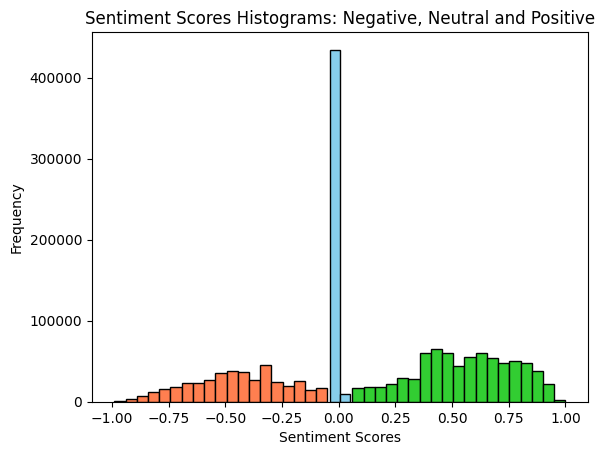

In [ ]:
# Create a histogram
plt.hist(df[df['sentiment_class_Vader']== 'Negative']['sentiment_score_Vader'], bins=19, color='coral', edgecolor='black')
plt.hist(df[df['sentiment_class_Vader']== 'Neutral']['sentiment_score_Vader'], bins=2, color='skyblue', edgecolor='black')
plt.hist(df[df['sentiment_class_Vader']== 'Positive']['sentiment_score_Vader'], bins=19, color='LimeGreen', edgecolor='black')

# Customize the plot
plt.title('Sentiment Scores Histograms: Negative, Neutral and Positive')
plt.xlabel('Sentiment Scores')
plt.ylabel('Frequency')

# Show the plot
plt.show()


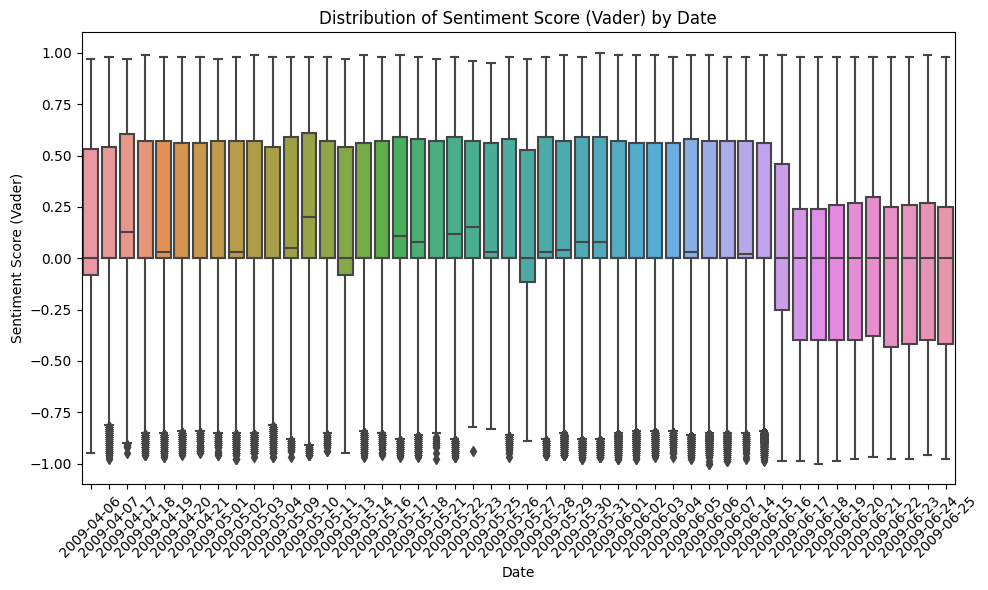

In [ ]:
# boxplot over time
# Group the DataFrame by date
grouped = df.groupby('day')

# Create a boxplot of sentiment_score_Vader by date
plt.figure(figsize=(10, 6))
sns.boxplot(x='day', y='sentiment_score_Vader', data=df)

plt.title('Distribution of Sentiment Score (Vader) by Date')
plt.xlabel('Date')
plt.ylabel('Sentiment Score (Vader)')

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

#### Average Sentiment Score over time

In [ ]:
tweet_activity = df[['day', 'sentiment_score_Vader']].groupby('day').mean().unstack()
tweet_activity.head()

                       day       
sentiment_score_Vader  2009-04-06    0.142048
                       2009-04-07    0.161942
                       2009-04-17    0.198797
                       2009-04-18    0.180767
                       2009-04-19    0.184280
dtype: float64

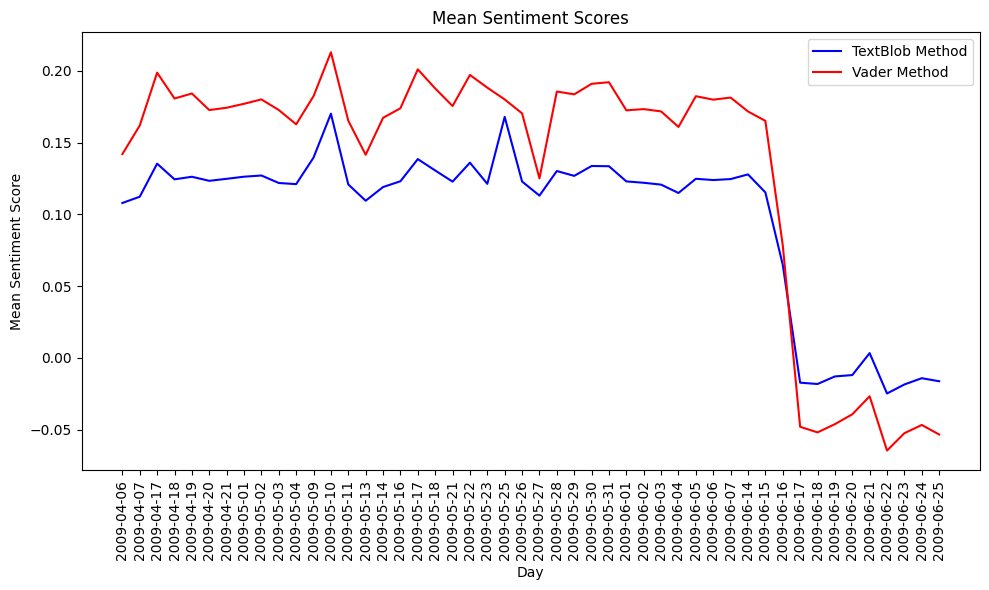

In [ ]:
tweets_by_day_TextBlob = df[['day', 'sentiment_score_TextBlob']].groupby('day').mean()
tweets_by_day_Vader = df[['day', 'sentiment_score_Vader']].groupby('day').mean()

# Create a single plot
plt.figure(figsize=(10, 6))
# First subplot for 'TextBlob' sentiment scoring
sns.lineplot(data=tweets_by_day_TextBlob, x='day' , y='sentiment_score_TextBlob', color='blue', label='TextBlob Method')
# Second subplot for 'Vader' sentiment scoring
sns.lineplot(data=tweets_by_day_Vader, x='day' , y='sentiment_score_Vader', color='red', label='Vader Method')
plt.title('Mean Sentiment Scores')
plt.xlabel('Day')
plt.ylabel('Mean Sentiment Score')
plt.legend()
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

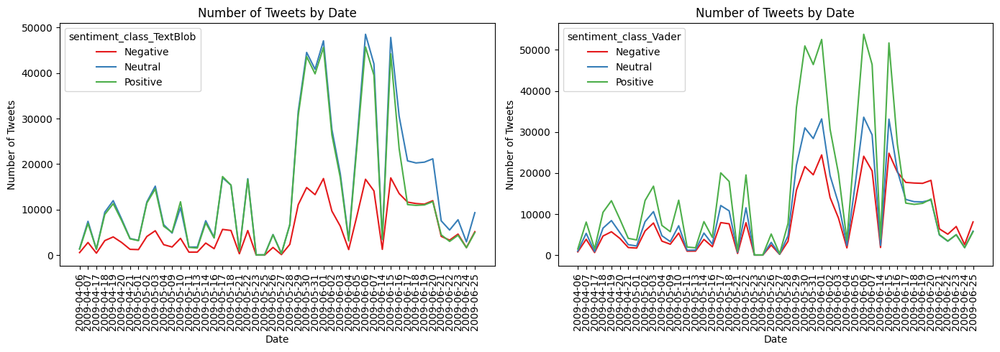

In [ ]:
tweets_by_date_TextBlob = df.groupby(['day', 'sentiment_class_TextBlob']).size().reset_index(name='count')
tweets_by_date_Vader = df.groupby(['day', 'sentiment_class_Vader']).size().reset_index(name='count')

# Create subplots using Matplotlib
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# First subplot for 'Positive' sentiment class
sns.lineplot(data=tweets_by_date_TextBlob, x='day', y='count', ax=axes[0], color='blue', hue='sentiment_class_TextBlob', palette='Set1')
axes[0].set_title('Number of Tweets by Date')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Number of Tweets')
axes[0].tick_params("x",labelrotation=90)

# Second subplot for 'Negative' sentiment class
sns.lineplot(data=tweets_by_date_Vader, x='day', y='count', ax=axes[1], color='red', hue='sentiment_class_Vader', palette='Set1')
axes[1].set_title('Number of Tweets by Date')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Number of Tweets')

plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

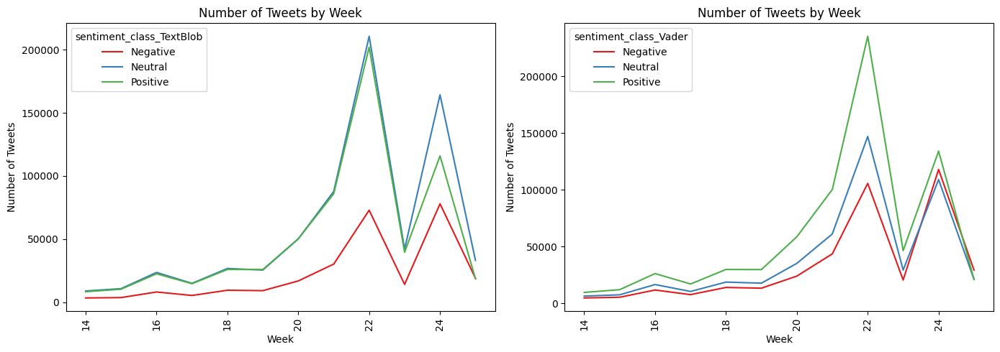

In [ ]:
tweets_by_week_of_year_TextBlob = df.groupby(['week_of_year' , 'sentiment_class_TextBlob']).size().reset_index(name='count')
tweets_by_week_of_year_Vader = df.groupby(['week_of_year' , 'sentiment_class_Vader']).size().reset_index(name='count')

# Create subplots using Matplotlib
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# First subplot for 'Positive' sentiment class
sns.lineplot(data=tweets_by_week_of_year_TextBlob, x='week_of_year' , y='count', ax=axes[0], color='blue', hue='sentiment_class_TextBlob', palette='Set1')
axes[0].set_title('Number of Tweets by Week')
axes[0].set_xlabel('Week')
axes[0].set_ylabel('Number of Tweets')
axes[0].tick_params("x",labelrotation=90)

# Second subplot for 'Negative' sentiment class
sns.lineplot(data=tweets_by_week_of_year_Vader, x='week_of_year' , y='count', ax=axes[1], color='red', hue='sentiment_class_Vader', palette='Set1')
axes[1].set_title('Number of Tweets by Week')
axes[1].set_xlabel('Week')
axes[1].set_ylabel('Number of Tweets')

plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

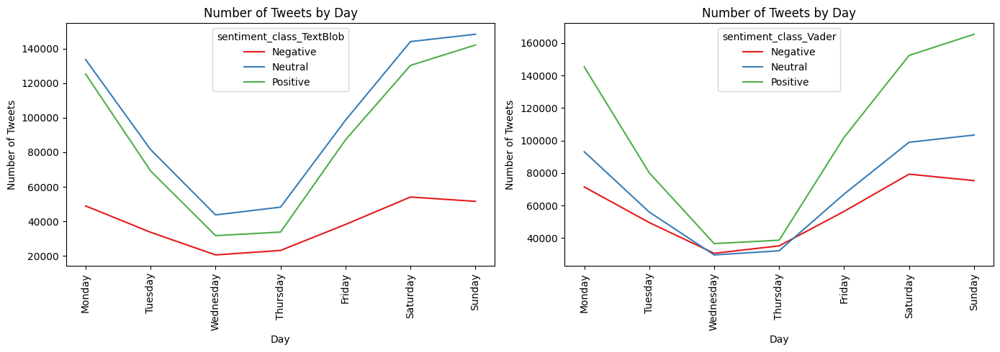

In [ ]:
tweets_by_hour_of_day_TextBlob = df.groupby(['day_of_week', 'sentiment_class_TextBlob']).size().reset_index(name='count')
tweets_by_hour_of_day_Vader = df.groupby(['day_of_week', 'sentiment_class_Vader']).size().reset_index(name='count')

# Create subplots using Matplotlib
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# First subplot for 'Positive' sentiment class
sns.lineplot(data=tweets_by_hour_of_day_TextBlob, x='day_of_week', y='count', ax=axes[0], color='blue', hue='sentiment_class_TextBlob', palette='Set1')
axes[0].set_title('Number of Tweets by Day')
axes[0].set_xlabel('Day')
axes[0].set_ylabel('Number of Tweets')
axes[0].tick_params("x",labelrotation=90)

# Second subplot for 'Negative' sentiment class
sns.lineplot(data=tweets_by_hour_of_day_Vader, x='day_of_week', y='count', ax=axes[1], color='red', hue='sentiment_class_Vader', palette='Set1')
axes[1].set_title('Number of Tweets by Day')
axes[1].set_xlabel('Day')
axes[1].set_ylabel('Number of Tweets')

plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

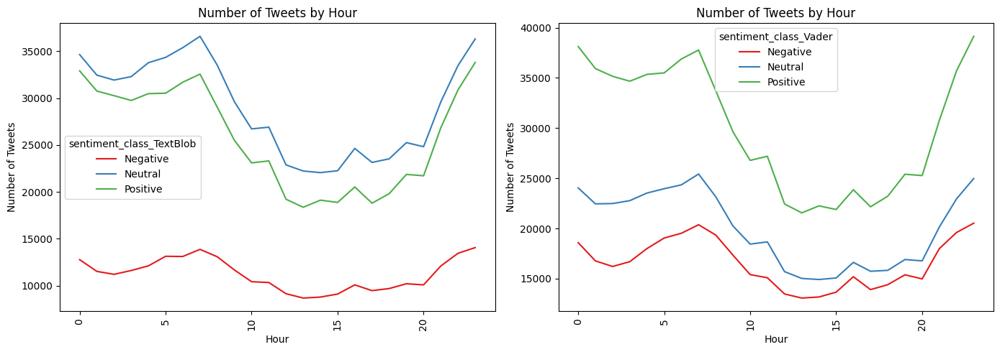

In [ ]:
tweets_by_hour_of_day_TextBlob = df.groupby(['hour_of_day', 'sentiment_class_TextBlob']).size().reset_index(name='count')
tweets_by_hour_of_day_Vader = df.groupby(['hour_of_day', 'sentiment_class_Vader']).size().reset_index(name='count')

# Create subplots using Matplotlib
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# First subplot for 'Positive' sentiment class
sns.lineplot(data=tweets_by_hour_of_day_TextBlob, x='hour_of_day', y='count', ax=axes[0], color='blue', hue='sentiment_class_TextBlob', palette='Set1')
axes[0].set_title('Number of Tweets by Hour')
axes[0].set_xlabel('Hour')
axes[0].set_ylabel('Number of Tweets')
axes[0].tick_params("x",labelrotation=90)

# Second subplot for 'Negative' sentiment class
sns.lineplot(data=tweets_by_hour_of_day_Vader, x='hour_of_day', y='count', ax=axes[1], color='red', hue='sentiment_class_Vader', palette='Set1')
axes[1].set_title('Number of Tweets by Hour')
axes[1].set_xlabel('Hour')
axes[1].set_ylabel('Number of Tweets')

plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

#### Heatmap of the mean sentiment day by day.

I plotted this as a histogram in the Y axis and a time (date) in the X axis.

In [ ]:
df[['day', 'sentiment_score_Vader', 'sentiment_class_Vader',  'sentiment_bin']].head()

,day,sentiment_score_Vader,sentiment_class_Vader,sentiment_bin
0,2009-04-06,-0.20,Negative,"(-0.25, -0.2]"
1,2009-04-06,-0.75,Negative,"(-0.8, -0.75]"
2,2009-04-06,0.49,Positive,"(0.45, 0.5]"
3,2009-04-06,-0.25,Negative,"(-0.3, -0.25]"
4,2009-04-06,-0.66,Negative,"(-0.7, -0.65]"


In [ ]:
# Group and count tweets by day of the week and hour of the day
df['sentiment_bin'] = pd.cut(df['sentiment_score_Vader'], list(np.linspace(-1, 1, 41)))
grouped = df[['day', 'sentiment_score_Vader', 'sentiment_class_Vader',  'sentiment_bin']].groupby(['sentiment_bin', 'day'])
tweet_activity = grouped.size().unstack()
tweet_activity.head()

day,2009-04-06,2009-04-07,2009-04-17,2009-04-18,2009-04-19,2009-04-20,2009-04-21,2009-05-01,2009-05-02,2009-05-03,...,2009-06-16,2009-06-17,2009-06-18,2009-06-19,2009-06-20,2009-06-21,2009-06-22,2009-06-23,2009-06-24,2009-06-25
sentiment_bin,,,,,,,,,,,,,,,,,,,,,
"(-1.0, -0.95]",0,9,1,4,7,4,1,2,9,3,...,36,21,21,25,27,10,9,7,5,4
"(-0.95, -0.9]",6,32,7,38,39,27,13,17,40,63,...,173,167,193,174,175,66,62,74,27,77
"(-0.9, -0.85]",20,75,4,75,105,72,30,31,112,149,...,379,361,373,370,368,127,108,167,67,196
"(-0.85, -0.8]",21,109,19,131,155,100,53,56,179,232,...,693,570,573,558,614,212,175,245,89,301
"(-0.8, -0.75]",35,150,25,168,201,139,72,76,236,299,...,811,799,765,708,775,272,254,299,104,350


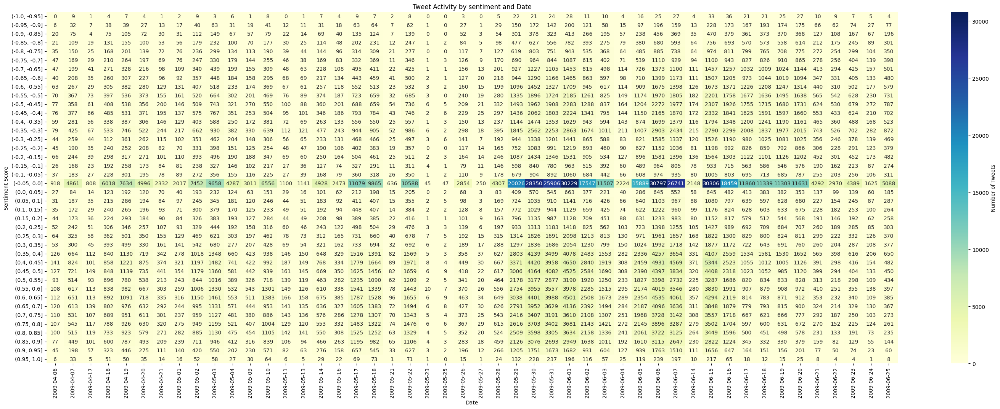

In [ ]:
# Create the heatmap
plt.figure(figsize=(36, 12))
sns.heatmap(tweet_activity, cmap='YlGnBu', annot=True, fmt='d', cbar_kws={'label': 'Number of Tweets'})
plt.title('Tweet Activity by sentiment and Date')
plt.xlabel('Date')
plt.ylabel('Sentiment Score')

# Show the heatmap
plt.show()

#### Variation of sentiment by user

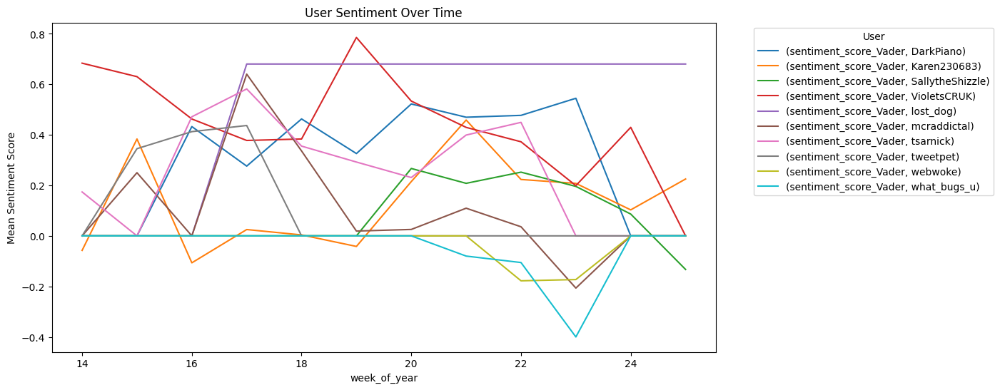

In [ ]:
# We use the value_counts() function to count the frequency of each user in the 'user' column.
user_counts = df.user.value_counts().head(10)

# We filter the DataFrame to include only tweets from the top 20 users.
filtered_df =  df[df.user.isin(user_counts.index)]

# We group the data by date and calculate the mean sentiment score on each day.
user_sentiment_over_time = filtered_df[['week_of_year', 'user', 'sentiment_score_Vader']].groupby(['week_of_year', 'user']).mean()

# Pivot the table in order to fill null values (days when the user did not post) with zeros
user_sentiment_over_time = user_sentiment_over_time.unstack(fill_value=0)

# Create a line plot
user_sentiment_over_time.plot(figsize=(12, 6))
plt.title('User Sentiment Over Time')
plt.xlabel('week_of_year')
plt.ylabel('Mean Sentiment Score')
plt.legend(title='User', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the line plot
plt.show()

## Hashtag and Mention Analysis:

- Bar Chart: Create a bar chart to show the most frequently used hashtags or mentions.
It involves analyzing and examining hashtags (#) and mentions (@) in social media data to understand user engagement, trending topics, and community dynamics. The goal is to quantify the frequency, sentiment and influence of these elements, offering insights into conversations and user behavior on platforms like Twitter.

In [ ]:
# Find the 20 most used hashtags
hashtag_counts = df.hashtags.value_counts().head(51)

# Remove the first element, because 1.5 million tweets have [] hashtag
hashtag_counts = hashtag_counts.iloc[1:]
hashtag_counts

[followfriday]       2403
[fb]                 1715
[ff]                  880
[squarespace]         805
[1]                   427
[iranelection]        403
[musicmonday]         385
[asot400]             326
[iremember]           288
[myweakness]          265
[2]                   257
[bgt]                 238
[fail]                223
[f1]                  216
[e3]                  214
[bsb]                 198
[iphone]              180
[inaperfectworld]     175
[haveyouever]         166
[spymaster]           156
[goodsex]             124
[andyhurleyday]       114
[mmwanted]            103
[clothdiapers]        101
[dontyouhate]          98
[asylm]                94
[xboxe3]               92
[3]                    92
[140conf]              91
[flylady]              85
[follow]               81
[hoppusday]            73
[pakcricket]           70
[hhrs]                 70
[tweetdeck]            69
[eu09]                 69
[apprentice]           69
[sytycd]               69
[zenjar]    

In [ ]:
#hashtag_counts = hashtag_counts.drop([4, 10, 27, 47])
#hashtag_counts

427

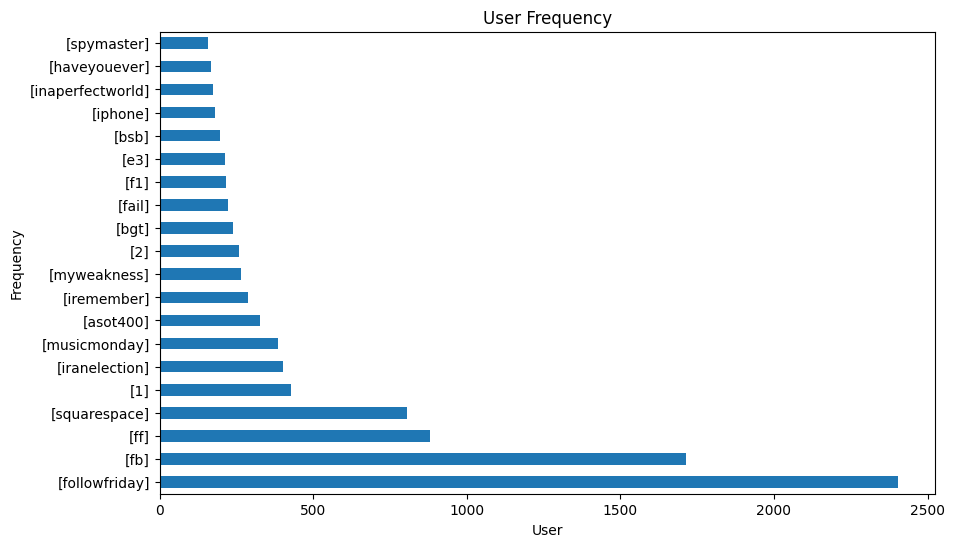

In [ ]:
# Create a bar chart
# We create a bar plot using Matplotlib with hashtags on the y-axis and tweet frequencies on the x-axis.
plt.figure(figsize=(10, 6))
hashtag_counts.plot(kind='barh')
plt.title('User Frequency')
plt.xlabel('User')
plt.ylabel('Frequency')

# Show the bar chart
plt.show()

In [ ]:
from itertools import chain

# Remove single quotes, square brackets in the 'hashtag' column
df['hashtags'] = df['hashtags'].astype(str).str.replace("'", '').str.replace('\[', '').str.replace('\]', '').str.lower()

# Split the strings and flatten the resulting list to make a list of hashtags
hashtag_series = df['hashtags'].str.split().apply(lambda x: [item for item in x])
hashtag_series = pd.Series(list(chain.from_iterable(hashtag_series)))

# We use the value_counts() function to count the frequency of each hashtag in the 'hashtag' column.
hashtag_series.value_counts().head(10)

<ipython-input-21-3327fe2ff9b6>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  df['hashtags'] = df['hashtags'].astype(str).str.replace("'", '').str.replace('\[', '').str.replace('\]', '').str.lower()


followfriday    2481
fb              1771
ff               923
squarespace      854
1                462
iranelection     447
seb,             435
musicmonday      399
asot400          331
fail             324
dtype: int64

followfriday
fb
ff
squarespace
1
iranelection
seb,
musicmonday
asot400
fail


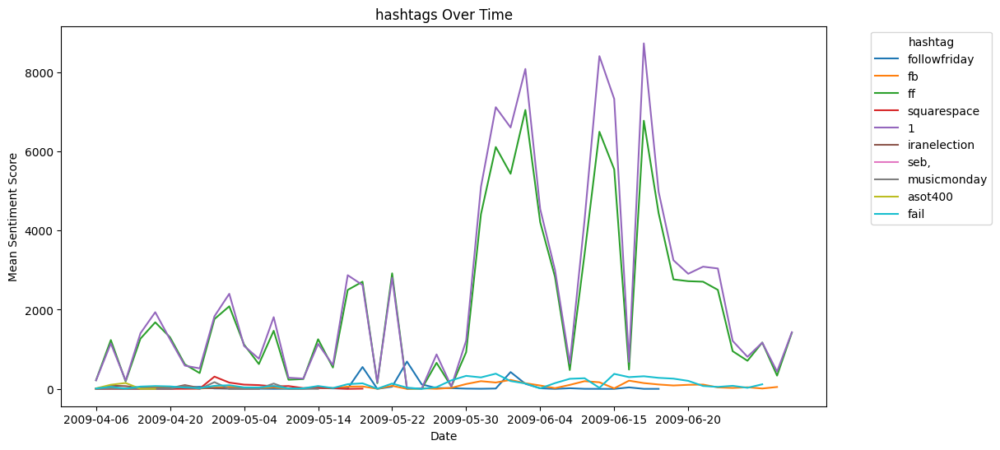

In [ ]:
for hashtag in hashtag_series.value_counts().head(10).index.tolist():
    print(hashtag)
    filtered_df = df[df['text'].str.contains(hashtag)]

    # We group the data by date and calculate the mean sentiment score on each week.
    hashtags_over_time = filtered_df[['day', 'sentiment_score_Vader']].groupby(['day']).size()


    # Create a line plot
    hashtags_over_time.plot(figsize=(12, 6), label = hashtag)

plt.title('hashtags Over Time')
plt.xlabel('Date')
plt.ylabel('Mean Sentiment Score')
plt.legend(title = "hashtag", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the line plot
plt.show()

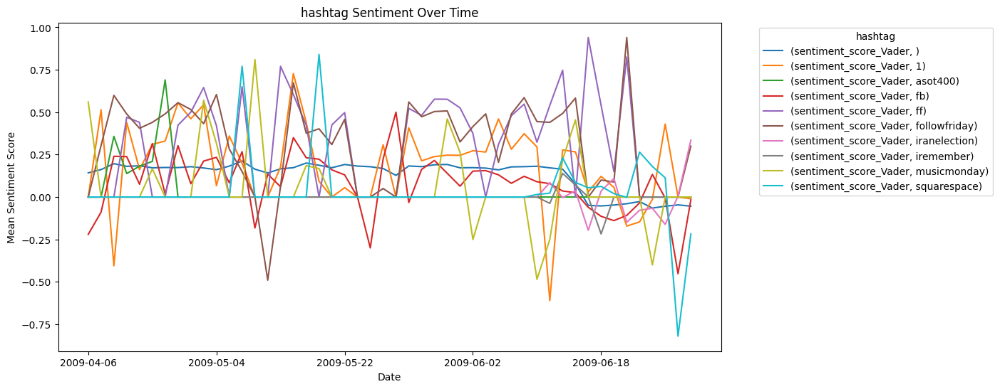

In [ ]:
# We use the value_counts() function to count the frequency of each hashtag in the 'hashtag' column.
hashtag_counts = df.hashtags.value_counts().head(10)

# We filter the DataFrame to include only tweets from the top 20 hashtags.
filtered_df =  df[df.hashtags.isin(hashtag_counts.index)]

# We group the data by date and calculate the mean sentiment score on each day.
hashtag_sentiment_over_time = filtered_df[['day', 'hashtags', 'sentiment_score_Vader']].groupby(['day', 'hashtags']).mean()

# Pivot the table in order to fill null values (days when the hashtag did not post) with zeros
hashtag_sentiment_over_time = hashtag_sentiment_over_time.unstack(fill_value=0)

# Create a line plot
hashtag_sentiment_over_time.plot(figsize=(12, 6))
plt.title('hashtag Sentiment Over Time')
plt.xlabel('Date')
plt.ylabel('Mean Sentiment Score')
plt.legend(title='hashtag', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the line plot
plt.show()

#### Frequency of mentions of users

In [ ]:
# First, we find the list of the most common mentioned users:
df.mentions.value_counts().head(20)

[]                     860675
['mileycyrus']           4189
['tommcfly']             3608
['ddlovato']             3110
['jonasbrothers']        2144
['davidarchie']          1287
['donniewahlberg']       1184
['jonathanrknight']      1099
['jordanknight']         1018
['mitchelmusso']         1014
['taylorswift13']         939
['selenagomez']           675
['dougiemcfly']           663
['aplusk']                564
['peterfacinelli']        561
['dannymcfly']            555
['youngq']                527
['joeymcintyre']          506
['gfalcone601']           486
['shaundiviney']          471
Name: mentions, dtype: int64

In [ ]:
from itertools import chain

# Remove single quotes, square brackets in the 'mention' column
mention_series = df.mentions.str.replace("'", '').str.replace('\[', '').str.replace('\]', '')

# Split the strings and flatten the resulting list to make a list of mentions
mention_series = mention_series.str.split().apply(lambda x: [item for item in x])
mention_series = pd.Series(list(chain.from_iterable(mention_series)))

# We use the value_counts() function to count the frequency of each mention in the 'mention' column.
mention_series.value_counts().head(10)

<ipython-input-58-7a8d74d9cf16>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  mention_series = df.mentions.str.replace("'", '').str.replace('\[', '').str.replace('\]', '')


mileycyrus         4341
tommcfly           3703
ddlovato           3266
jonasbrothers      2260
davidarchie        1343
donniewahlberg     1253
jonathanrknight    1192
jordanknight       1077
mitchelmusso       1048
taylorswift13       978
dtype: int64

In [ ]:
#list of mentions
mention_list = "|".join(mention_series.value_counts().head(10).index.tolist())
mention_list

'mileycyrus|tommcfly|ddlovato|jonasbrothers|davidarchie|donniewahlberg|jonathanrknight|jordanknight|mitchelmusso|taylorswift13'

In [ ]:
# We filter the DataFrame to include only tweets that mention one of the first 10 mentions.
filtered_df = df[df['text'].str.contains(mention_list)]

mileycyrus
tommcfly
ddlovato
jonasbrothers
davidarchie
donniewahlberg
jonathanrknight
jordanknight
mitchelmusso
taylorswift13


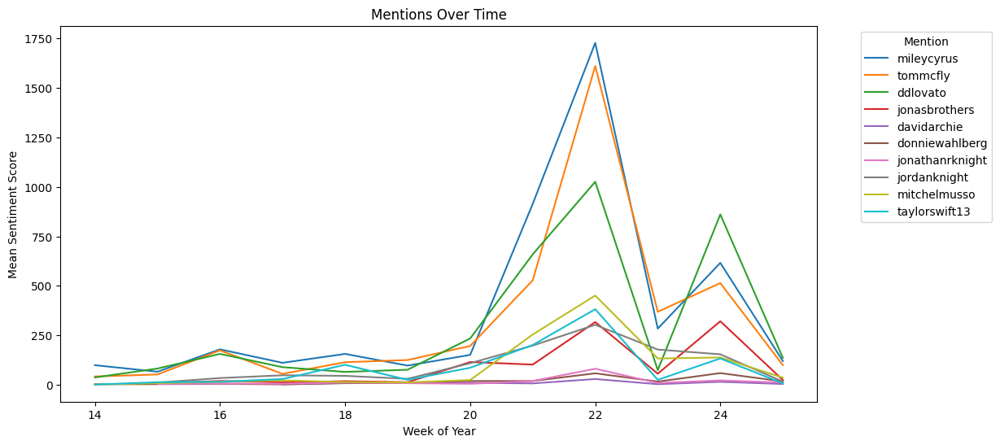

In [ ]:
for mention in mention_series.value_counts().head(10).index.tolist():
    print(mention)
    filtered_df = df[df['text'].str.contains(mention)]

    # We group the data by date and calculate the mean sentiment score on each week.
    mentions_over_time = filtered_df[['week_of_year', 'sentiment_score_Vader']].groupby(['week_of_year']).size()


    # Create a line plot
    mentions_over_time.plot(figsize=(12, 6), label = mention)

plt.title('Mentions Over Time')
plt.xlabel('Week of Year')
plt.ylabel('Mean Sentiment Score')
plt.legend(title = "Mention", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the line plot
plt.show()

mileycyrus
tommcfly
ddlovato
jonasbrothers
davidarchie
donniewahlberg
jonathanrknight
jordanknight
mitchelmusso
taylorswift13


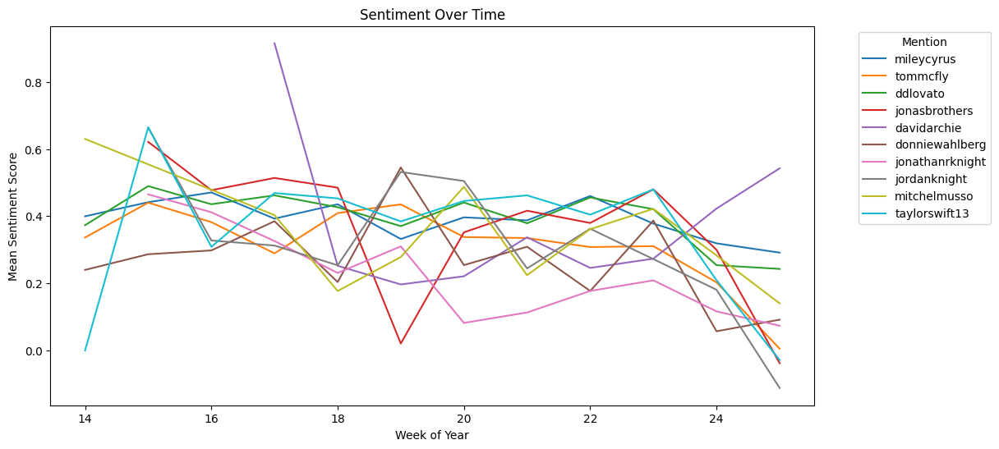

In [ ]:
for mention in mention_series.value_counts().head(10).index.tolist():
    print(mention)
    filtered_df = df[df['text'].str.contains(mention)]

    # We group the data by date and calculate the mean sentiment score on each week.
    mentions_over_time = filtered_df[['week_of_year', 'sentiment_score_Vader']].groupby(['week_of_year']).mean()

    # Pivot the table in order to fill null values (days when the user did not post) with zeros
    mentions_over_time = mentions_over_time.unstack(fill_value=0).reset_index().set_index('week_of_year')
    mentions_over_time.columns = ['level_0', 'Mean_sentiment_score_Vader']
    mentions_over_time = mentions_over_time['Mean_sentiment_score_Vader']

    # Create a line plot
    mentions_over_time.plot(figsize=(12, 6), label = mention)

plt.title('Sentiment Over Time')
plt.xlabel('Week of Year')
plt.ylabel('Mean Sentiment Score')
plt.legend(title = "Mention", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the line plot
plt.show()

#### Wordclouds for negative, Neutral and Positive tweets

 Plot a cloud of words for negative tweets

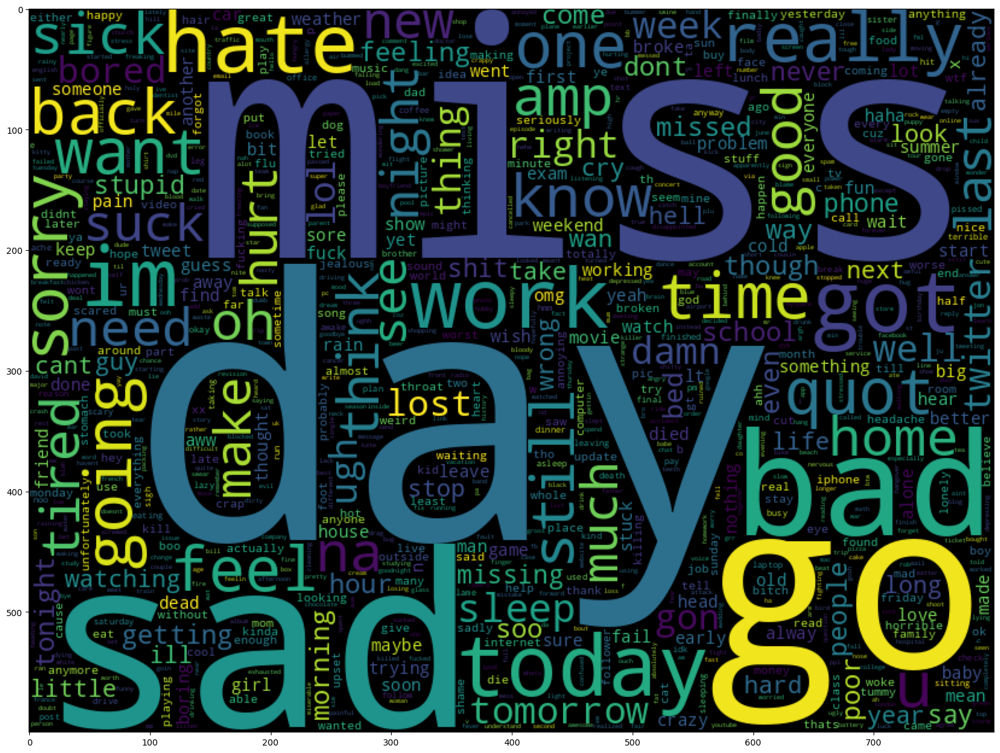

In [ ]:
data_neg = df[df['sentiment_class_Vader']=='Negative']['lemmatized_text2']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 800 , height = 600,
               collocations=False).generate(" ".join(data_neg))
plt.imshow(wc)

Plot a cloud of words for positive tweets

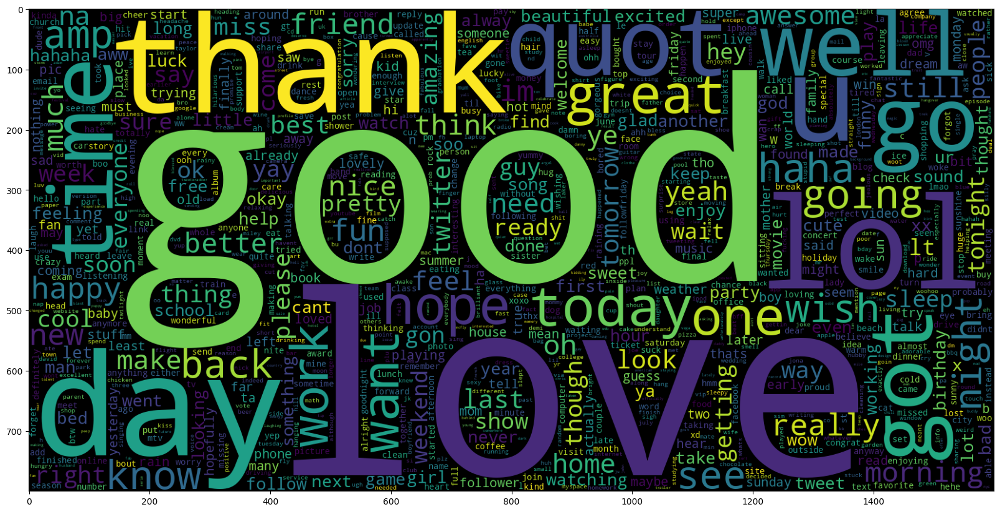

In [ ]:
data_pos = df[df['sentiment_class_Vader']=='Positive']['lemmatized_text2']
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
              collocations=False).generate(" ".join(data_pos))
plt.figure(figsize = (20,20))
plt.imshow(wc)

Plot a cloud of words for neutral tweets

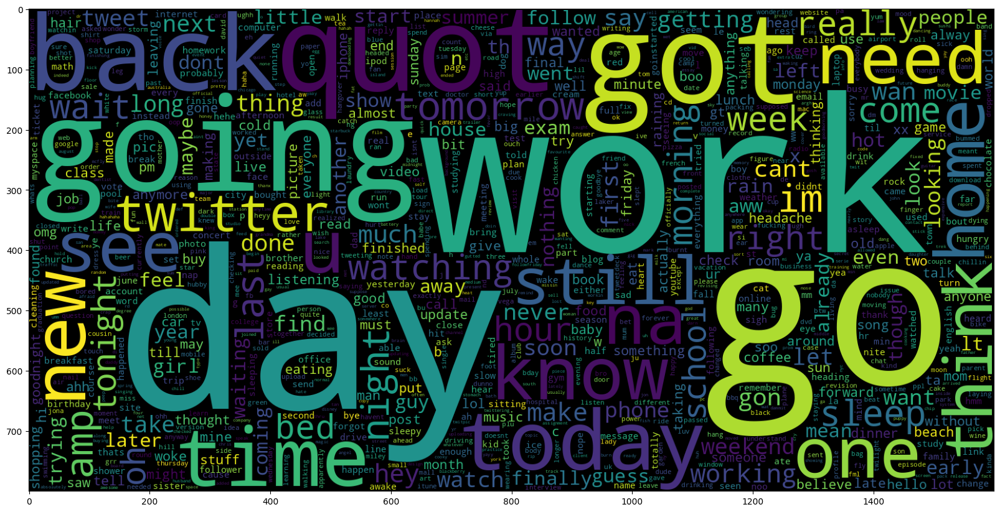

In [ ]:
data_pos = df[df['sentiment_class_Vader']=='Neutral']['lemmatized_text2']
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
              collocations=False).generate(" ".join(data_pos))
plt.figure(figsize = (20,20))
plt.imshow(wc)

# Apply Models to fit the data

In [ ]:
# Import Machine Learning methods and classes from sklearn library
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# sklearn metrics for visualization and assessment of models
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc

# Different models to test
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

Load data from where I was before

In [ ]:
# Load the labeled and lemmatized dataset
#df = pd.read_csv('/content/drive/MyDrive/ProjectTweets(2).csv')

fields = ['lemmatized_text2', 'sentiment_score_Vader', 'sentiment_class_Vader','week_of_year']

df = pd.read_csv('/content/drive/MyDrive/ProjectTweets(2).csv', usecols=fields, low_memory = True)

# Encode categories in a boolean column, (In order to plot ROC Curves)
# Define the bin edges and labels for two classes
bin_edges = [-1, 0, 1]
class_labels = [0, 1]
df['sentiment_class_Vader'] = pd.cut(df['sentiment_score_Vader'], bins=bin_edges, labels=class_labels)
df.head()

,week_of_year,lemmatized_text2,sentiment_score_Vader,sentiment_class_Vader
0,14,aww bummer shoulda got david carr third day,-0.20,0
1,14,upset update facebook texting might cry result...,-0.75,0
2,14,dived many time ball managed save rest go bound,0.49,1
3,14,whole body feel itchy like fire,-0.25,0
4,14,behaving mad see,-0.66,0


In [ ]:
# select only the data for the first week
df = df[df['week_of_year'].isin([14, 15])]
df.shape

(45458, 4)

## Transforming the Dataset Using Count vectorization

Transforms text into a sparse matrix of n-gram counts.

In [ ]:
list_tweets = list(df['lemmatized_text2'].values.astype('U'))
sentiment = df['sentiment_class_Vader'].values

# define max features: each instance (text) will have this number of features (atributes), that can range from 10000 to 5000000 different words
max_features=10000

In [ ]:
%%time

count_vector=CountVectorizer(max_features=max_features,ngram_range=(1, 2)) # stop_words="english" , ngram_range=(1, 2)

matrix_tweets_cv = count_vector.fit_transform(list_tweets)

# getting the words
all_words = count_vector.get_feature_names_out()

# visualize first 50 words
print("First 50 words: ",all_words[0:50])
print(matrix_tweets_cv.shape)

First 50 words:  ['aa' 'aah' 'aahh' 'aand' 'aargh' 'aaron' 'aaww' 'ab' 'abandoned' 'abit'
 'able' 'able find' 'able get' 'able go' 'able help' 'able make'
 'able sleep' 'able take' 'abruzzo' 'absolute' 'absolutely' 'abt' 'ac'
 'accent' 'accept' 'accepted' 'access' 'accessing' 'accident'
 'accidentally' 'according' 'account' 'accountant' 'accounting' 'accurate'
 'ace' 'ace last' 'ache' 'achievement' 'aching' 'ack' 'acknowledge' 'acm'
 'acne' 'across' 'act' 'acting' 'action' 'active' 'activity']
(20643, 10000)
CPU times: user 725 ms, sys: 6.31 ms, total: 732 ms
Wall time: 739 ms


### Transforming the Dataset Using TF-IDF Vectorizer

Performs the TF-IDF transformation from a provided matrix of counts.

Word counts are a good starting point but are very basic. One issue with simple counts is that some words like “the” will appear many times and their large count values will not be very meaningful in the encoded vectors.

An alternative is to calculate word frequencies. The most popular way of doing this is called TF-IDF. This is an acronym that stands for “Term Frequency – Inverse Document Frequency". It is calculated as so:

<img src="https://miro.medium.com/max/1400/1*mu6G-cBmWlENS4pWHEnGcg@2x.jpeg" width="500"/>


In [ ]:
%%time
# TfidfVectorizer is equivalent to CountVectorizer followed by TfidfTransformer.
vectorizer = TfidfVectorizer(max_features=max_features,ngram_range=(1, 2), decode_error='replace', encoding='utf-8')

matrix_tweets_tf = vectorizer.fit_transform(list_tweets)

# getting the words
all_words = vectorizer.get_feature_names_out()

# visualize first 50 words
print("First 50 words: ",all_words[0:50])
print(matrix_tweets_tf.shape)

First 50 words:  ['aa' 'aah' 'aahh' 'aand' 'aaron' 'aaw' 'aaww' 'ab' 'abandoned' 'abby'
 'abc' 'ability' 'abit' 'able' 'able get' 'able go' 'able make' 'able see'
 'able sleep' 'able take' 'abroad' 'absolute' 'absolutely' 'absolutly'
 'abt' 'abundance' 'ac' 'academy' 'accent' 'accept' 'accepted' 'access'
 'accident' 'accidentally' 'accidently' 'accomplished' 'according'
 'account' 'accounting' 'acct' 'accurate' 'ace' 'ache' 'achievement'
 'aching' 'ack' 'acoustic' 'across' 'act' 'acting']
(45458, 10000)
CPU times: user 2.29 s, sys: 58.5 ms, total: 2.35 s
Wall time: 4.33 s


In [ ]:
print(vectorizer.vocabulary_)

{'aww': 437, 'bummer': 930, 'shoulda': 7425, 'got': 3466, 'david': 1787, 'third': 8550, 'day': 1791, 'upset': 9232, 'update': 9214, 'facebook': 2668, 'texting': 8411, 'might': 5316, 'cry': 1708, 'result': 7028, 'school': 7222, 'today': 8718, 'also': 173, 'blah': 730, 'update facebook': 9215, 'school today': 7234, 'today also': 8721, 'many': 5143, 'time': 8622, 'ball': 533, 'managed': 5129, 'save': 7197, 'rest': 7020, 'go': 3271, 'bound': 828, 'many time': 5147, 'whole': 9614, 'body': 784, 'feel': 2743, 'itchy': 4231, 'like': 4631, 'fire': 2852, 'mad': 5058, 'see': 7280, 'crew': 1690, 'need': 5739, 'hug': 4015, 'need hug': 5764, 'hey': 3820, 'long': 4806, 'yes': 9936, 'rain': 6792, 'bit': 712, 'lol': 4766, 'fine': 2839, 'thanks': 8429, 'long time': 4813, 'time see': 8647, 'bit lol': 715, 'fine thanks': 2840, 'nope': 6035, 'que': 6717, 'spring': 7788, 'break': 852, 'plain': 6467, 'city': 1257, 'snowing': 7603, 'spring break': 7789, 'ear': 2279, 'bear': 581, 'watch': 9448, 'thought': 8562

## Splitting the Data Into Train and Test Subsets

Divide the  newly generated vectorial representation (matrix) into train and test sets

In [ ]:
%%time
# Sample data (X: features, y: target)
# This doesnt work, because the model requires a sparse matrix as input:
# X, y = df['lemmatized_text2'], df['sentiment_class_Vader']

#  sparse matrix as input and numeric vector as target:
X, y = matrix_tweets_tf.toarray(), df['sentiment_class_Vader'].values

# Step 1: Split the data into a temporary train set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=26105111) #, stratify = y)  #stratify preserves the original proportion of labels of the original dataset

# Print the sizes of the resulting sets
print(f"Train set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")

Train set size: 36366
Test set size: 9092
CPU times: user 549 ms, sys: 2.34 s, total: 2.88 s
Wall time: 4.78 s


In [ ]:
# Separate data for validation of hyperparameters
# Step 2: Further split the train set into a train set and a validation set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=26105111)

# The sizes are typically chosen as percentages of the original dataset:
# - Test set: 20% of the original data
# - Train set: 60% (or 70%) of the original data
# - Validation set: 20% (or 10%) of the original data. This data is used to tune hyperparameters

# Print the sizes of the resulting sets
print(f"Train set size: {len(X_train)}")
print(f"Validation set size: {len(X_val)}")
print(f"Test set size: {len(X_test)}")

Train set size: 12385
Validation set size: 4129
Test set size: 4129


## **Function for Model Evaluation**

After training the model, I will apply the evaluation measures to check how the model is performing. Accordingly, I use the following evaluation parameters to check the performance of the models respectively:



*  Accuracy Score
*  Confusion Matrix with Plot
*  ROC-AUC Curve

In [ ]:
def model_Evaluate(model):
    # Predict values for Test dataset
    y_pred = model.predict(X_test)

    # Print the evaluation metrics for the dataset.
    print(classification_report(y_test, y_pred))

    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(y_test, y_pred)
    categories = ['Negative','Positive']
    group_names = ['True Negative','False Positive', 'False Negative','True Positive']
    group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]Vectorizer
    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot= labels, cmap = 'Blues',fmt = '', xticklabels = categories, yticklabels = categories) #annot = labels
    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values" , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)
    plt.show()

    # Calculate the ROC curve and plot it
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC CURVE')
    plt.legend(loc="lower right")
    plt.show()

    return y_pred

In defining the problem, I used five different models, respectively:

**Bernoulli Naive Bayes Classifier**

**SVM (Support Vector Machine)**

**Logistic Regression**

**Linear Support Vector Classificatio (LinearSVC)**

**Classification using Ensemble (RandomForestClassifier)**

The idea behind choosing these models is to test all the classifiers in the dataset, from the simplest to the complex models, and then I will try to find the one that offers the best performance among them.

### **Model 1 Bernoulli Naive Bayes Classifier**

              precision    recall  f1-score   support

           0       0.81      0.88      0.84      4575
           1       0.87      0.79      0.83      4517

    accuracy                           0.84      9092
   macro avg       0.84      0.84      0.84      9092
weighted avg       0.84      0.84      0.84      9092



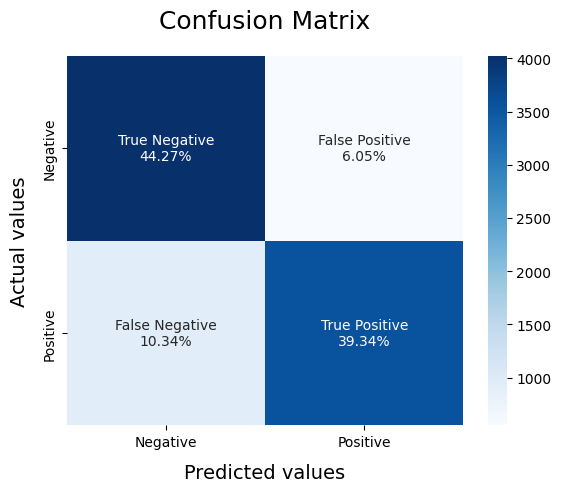

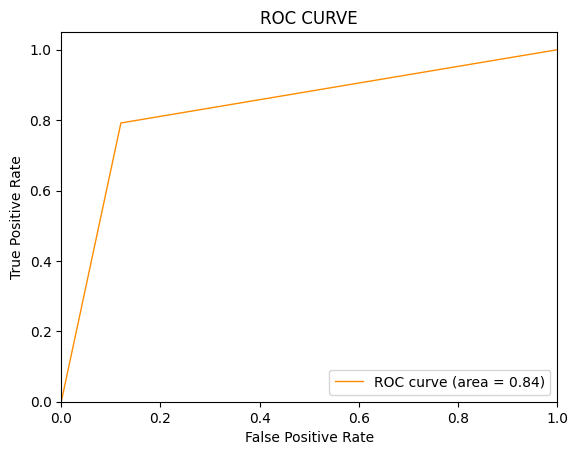

CPU times: user 5.18 s, sys: 1.94 s, total: 7.12 s
Wall time: 6.07 s


In [ ]:
%%time
BNBmodel = BernoulliNB()
BNBmodel.fit(X_train, y_train)
y_pred1 = model_Evaluate(BNBmodel)

#### Alternative implementation of TFIDF vectorizer

In this implementation, we use the encoding in Negative, Positive and Neutral values. It reflects better the usefulness of Vader, and the characteristic neutrality of most tweets. It is a multiclass output that is not possible to compare using one ROC curve. It may be necessary to plot 3 ROC curves and the interpretation is ambiguous.

In [ ]:
# Load the labeled and lemmatized dataset
#df = pd.read_csv('/content/drive/MyDrive/Nurse Salaries Project/ProjectTweets(2).csv')

fields = ['lemmatized_text2', 'sentiment_score_Vader', 'sentiment_class_Vader','week_of_year']

df = pd.read_csv('/content/drive/MyDrive/Nurse Salaries Project/ProjectTweets(2).csv', usecols=fields, low_memory = True)

# encode the categories in numeric values (three values)
df['sentiment_class_Vader'].replace(['Negative', 'Neutral', 'Positive'], [-1, 0, 1], inplace=True)
df.head()

,week_of_year,lemmatized_text2,sentiment_score_Vader,sentiment_class_Vader
0,14,aww bummer shoulda got david carr third day,-0.20,-1.0
1,14,upset update facebook texting might cry result...,-0.75,-1.0
2,14,dived many time ball managed save rest go bound,0.49,1.0
3,14,whole body feel itchy like fire,-0.25,-1.0
4,14,behaving mad see,-0.66,-1.0


In [ ]:
df = df[df['week_of_year']==14]

In [ ]:
list_tweets = list(df['lemmatized_text2'].values.astype('U'))
sentiment = df['sentiment_class_Vader'].values

In [ ]:
# split data into Train Test sets
train_x, test_x, train_y, test_y = train_test_split(list_tweets, sentiment, test_size = 0.2, random_state = 0)
print(f'Data Split done.')
print(f"Train set size: {len(train_x)}")
print(f"Test set size: {len(test_x)}")

Data Split done.
Train set size: 16514
Test set size: 4129


In [ ]:
vectoriser = TfidfVectorizer(ngram_range=(1,2), max_features=5000)
vectoriser.fit(train_x)
print(f'Vectorizer fitted')
print('No. of feature_words: ',len(vectoriser.get_feature_names_out()))

Vectorizer fitted
No. of feature_words:  5000


In [ ]:
%%time
X_train_v = vectoriser.transform(train_x)
X_test_v  = vectoriser.transform(test_x)
print(type(X_train_v), X_train_v.shape)
print(type(X_test_v), X_test_v.shape)

<class 'scipy.sparse._csr.csr_matrix'> (16514, 5000)
<class 'scipy.sparse._csr.csr_matrix'> (4129, 5000)
CPU times: user 461 ms, sys: 3.17 ms, total: 464 ms
Wall time: 476 ms


              precision    recall  f1-score   support

        -1.0       0.72      0.59      0.65       993
         0.0       0.73      0.83      0.78      1206
         1.0       0.84      0.84      0.84      1930

    accuracy                           0.78      4129
   macro avg       0.76      0.75      0.75      4129
weighted avg       0.78      0.78      0.78      4129



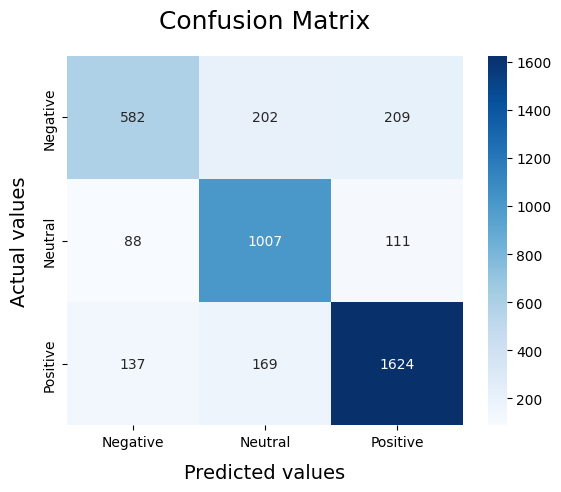

CPU times: user 265 ms, sys: 105 ms, total: 370 ms
Wall time: 251 ms


In [ ]:
%%time
BNBmodel = BernoulliNB()
BNBmodel.fit(X_train_v, train_y)

y_pred = BNBmodel.predict(X_test_v)

# Print the evaluation metrics for the dataset.
print(classification_report(test_y, y_pred))

# Compute and plot the Confusion matrix
cf_matrix = confusion_matrix(test_y, y_pred)
categories = ['Negative', 'Neutral', 'Positive']
group_names = ['True Negative','False Positive', 'False Negative','True Positive']
group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]
#labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
#labels = np.asarray(labels).reshape(2,2)

sns.heatmap(cf_matrix, annot=True, cmap = 'Blues',fmt = '', xticklabels = categories, yticklabels = categories)
plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
plt.ylabel("Actual values" , fontdict = {'size':14}, labelpad = 10)
plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)
plt.show()

### **Model 2 SVM (Support Vector Machine)**

              precision    recall  f1-score   support

           0       0.85      0.90      0.87      4575
           1       0.89      0.84      0.87      4517

    accuracy                           0.87      9092
   macro avg       0.87      0.87      0.87      9092
weighted avg       0.87      0.87      0.87      9092



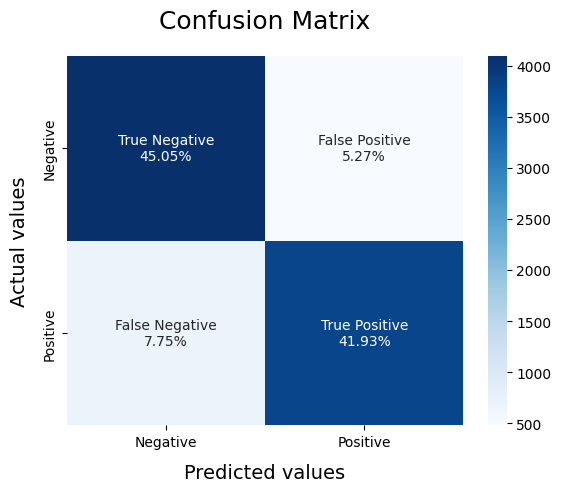

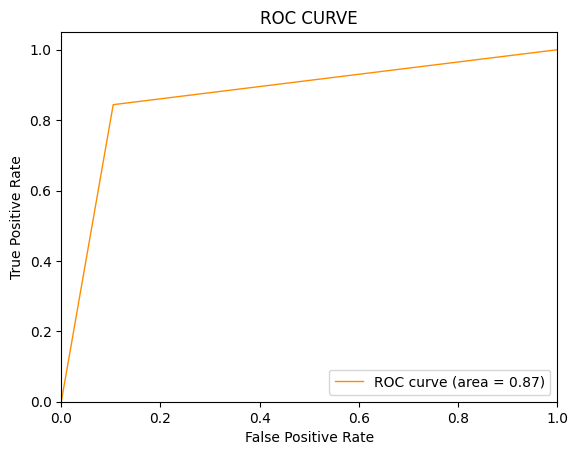

CPU times: user 2.56 s, sys: 289 ms, total: 2.85 s
Wall time: 2.51 s


In [ ]:
%%time
SVCmodel = LinearSVC()
SVCmodel.fit(X_train, y_train)
y_pred2 = model_Evaluate(SVCmodel)

### **Model 3 Logistic Regression**

              precision    recall  f1-score   support

           0       0.85      0.90      0.88      4575
           1       0.89      0.84      0.87      4517

    accuracy                           0.87      9092
   macro avg       0.87      0.87      0.87      9092
weighted avg       0.87      0.87      0.87      9092



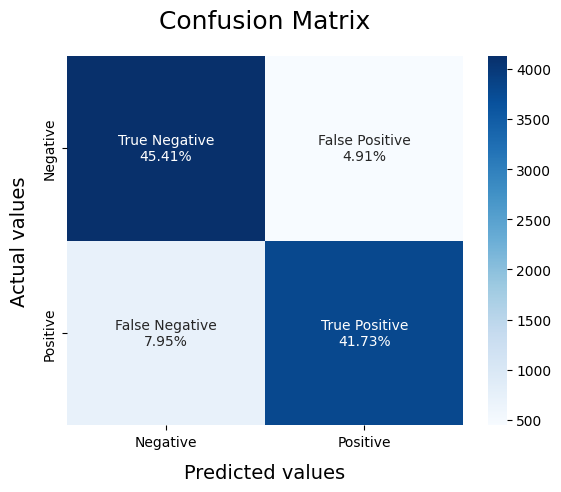

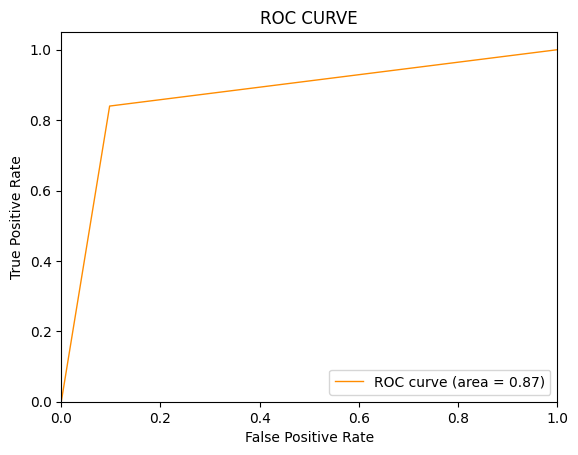

In [ ]:
LRmodel = LogisticRegression(C = 2, max_iter = 1000, n_jobs=-1)
LRmodel.fit(X_train, y_train)
y_pred3 = model_Evaluate(LRmodel)

### **Model 4 Linear Support Vector Classification (LinearSVC)**

In [ ]:
'''
X_train, X_test, y_train, y_test = train_test_split(df['text'], df['label'], test_size=0.2, random_state=42)
 '''
 # do I have to load the sets diferently???

In [ ]:
from sklearn.svm import SVC
clf=SVC()
clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,confusion_matrix
test_acc_svc=accuracy_score(y_test,y_pred)
print(test_acc_svc)
cfm=confusion_matrix(y_test,y_pred)
print(cfm)

In [ ]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(cfm, annot=True, fmt='d', linewidths=0.5, cmap='winter', cbar=True, annot_kws={"size": 12})

# Add axis labels
ax.set_xlabel("Predicted Labels")
ax.set_ylabel("True Labels")

# Display the plot
plt.show()

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc_svc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))

# Plot the ROC curve
plt.plot(fpr, tpr, color='navy', lw=1.5, label='ROC curve (area = %0.2f)' % roc_auc_svc)

# Add labels and title
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Add a diagonal line for reference
plt.plot([0, 1], [0, 1], color='skyblue', lw=1, linestyle='--')

# Customize grid lines
plt.grid(color='gray', linestyle='--', linewidth=0.5)



plt.show()

### **Model 5 Classification using Ensemble (RandomForestClassifier)**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

random_forest_classifier = RandomForestClassifier(n_estimators=100)
random_forest_classifier.fit(X_train, y_train)
yr_pred = random_forest_classifier.predict(X_test)
from sklearn.metrics import accuracy_score,confusion_matrix
test_acc_rfc=accuracy_score(y_test,yr_pred)
print(test_acc_rfc)
rf_cfm=confusion_matrix(y_test,yr_pred)
print(rf_cfm)

In [ ]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(rf_cfm, annot=True, fmt='', linewidths=0.5, cmap='winter', cbar=True, annot_kws={"size": 12})

# Add axis labels
ax.set_xlabel("Predicted Labels")
ax.set_ylabel("True Labels")

# Display the plot
plt.show()

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr_rfc, tpr_rfc, thresholds = roc_curve(y_test, yr_pred)
roc_auc_rfc = auc(fpr_rfc, tpr_rfc)

plt.figure(figsize=(8, 6))

# Plot the ROC curve
plt.plot(fpr_rfc, tpr_rfc, color='navy', lw=1.5, label='ROC curve (area = %0.2f)' % roc_auc_rfc)

# Add labels and title
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Add a diagonal line for reference
plt.plot([0, 1], [0, 1], color='skyblue', lw=1, linestyle='--')

# Customize grid lines
plt.grid(color='gray', linestyle='--', linewidth=0.5)



plt.show()

In [ ]:
# Create a bar chart to compare accuracy
models = ['SVC', 'RFC']
accuracies = [test_acc_svc, test_acc_rfc]

plt.bar(models, accuracies, color=['lightblue', 'lightgreen'])
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.ylim(0, 1.0)  # Set the y-axis limit from 0 to 1 for accuracy
# Annotate the bars with accuracy values
for i, v in enumerate(accuracies):
    plt.text(i, v, f'{v:.2f}', ha='center', va='bottom')

plt.show()

In [ ]:
# Create a ROC curve comparison plot
plt.figure(figsize=(8, 6))
plt.plot('fpr', 'tpr', color='darkorange', lw=2, label=f'SVC (AUC = {roc_auc_svc:.2f})')
plt.plot(fpr_rfc, tpr_rfc, color='navy', lw=1.6, label=f'RFC (AUC = {roc_auc_rfc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison')
plt.legend(loc="lower right")
plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.show()

In [ ]:
import joblib

# Save the model to a file
joblib.dump('clf', 'trained_model_svc.pkl')

In [ ]:
joblib.dump('random_forest_classifier','trained_model_rfc.pkl')

In [ ]:
!ls

##**Conclusion**

Through this project, I understood how Sentiment Analysis is used to understand public emotions behind tweets. Using the codes and information I got during this project, I was able to see and understand that Twitter Sentiment Analysis helps us to pre-process data (tweets) using different methods and feed it into ML models to provide the best accuracy.

# Code Reuse to be put in the right place

In [ ]:
# Install libraries for Tensor Computation with GPU acceleration for Deep Neural Networks
!pip install transformers
!pip install torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 47.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 88.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 73.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 29.7 MB/s eta 0:00:00


In [ ]:
# Import Neural Networks libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
# Make a list of weeks in order to load the data week by week
list_of_weeks = df.week_of_year.unique()
list_of_weeks

array([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25])

In [ ]:
list(range (len(df.week_of_year.unique())))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

In [ ]:
#Possible function to operate in the dataset by batches:
'''
def weekly_function(df, week):
    # filter just the data for the selected week
    df = df[df['week_of_year'] == list_of_weeks[week]]
    return df

for week in list(range (len(df.week_of_year.unique()))):
    df = weekly_function(df, week)
'''


"\ndef weekly_function(df, week):\n    # filter just the data for the selected week\n    df = df[df['week_of_year'] == list_of_weeks[week]]\n    return df\n\nfor week in list(range (len(df.week_of_year.unique()))):\n    df = weekly_function(df, week)\n"

# Code that doesnt have any sense

In [ ]:
# [Write about what I am trying to do here and why...]
#data['Indicator'] = 1599999

In [ ]:
#Transpose the dataframe (columns become index, index becomes columns)
data.T

In [ ]:
# Plotting the distribution for dataset.
ax = df.groupby('ids').count().plot(kind='bar', title='Distribution of data',legend=False)
ax.set_xticklabels(['Negative','Positive'], rotation=0)
# Storing data in lists.
text, sentiment = list(df['text']), list(df['ids'])

In [ ]:

sns.countplot(x='ids', data=df)

### Preprocessing instructions that are WRONG

Selecting the text and Target column for our further analysis

In [ ]:
#df=df[['ids','ids']]

Replacing the values to ease understanding. (Assigning 1 to Positive sentiment 4)

In [ ]:
#df['ids'] = df['ids'].replace(4,1)

Printing unique values of ids variables

In [ ]:
#df['ids'].unique()

Separating positive and negative tweets

In [ ]:
#df_pos = data[data['ids'] == 1]
#df_neg = data[data['ids'] == 0]

Taking one-fourth of the data so I can run it on our machine easily

In [ ]:
#df_pos = df_pos.iloc[:int(20000)]
#df_neg = df_neg.iloc[:int(20000)]

Combining positive and negative tweets

In [ ]:
#df = pd.concat([df_pos, df_neg])

Separating input feature and label

In [ ]:
#data[data['ids']==-1]['text']